###Connecting Google Colab and Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/My Drive/Final Project

/content/drive/My Drive/Final Project


In [ ]:
!pwd

/content/drive/My Drive/Final Project


In [ ]:
ls

 click_stream.csv   Hermes_RFM_Clustering.ipynb   product.csv   RFM_Customer.csv
 customer.csv      'K-Medoid Model.ipynb'         RFM.csv       transactions.csv


###Data Preparation

In [ ]:
# Import Packages
import pandas as pd
import matplotlib.pyplot as plt

**DATASET CUSTOMER**

In [ ]:
# Mengimpor dataset customer
df_c = pd.read_csv('/content/drive/MyDrive/Final Project/customer.csv')

# Menampilkan 5 data teratas dari dataset customer
df_c.head()

,customer_id,first_name,last_name,username,email,gender,birthdate,device_type,device_id,device_version,home_location_lat,home_location_long,home_location,home_country,first_join_date
0,2870,Lala,Maryati,671a0865-ac4e-4dc4-9c4f-c286a1176f7e,671a0865_ac4e_4dc4_9c4f_c286a1176f7e@startupca...,F,1996-06-14,iOS,c9c0de76-0a6c-4ac2-843f-65264ab9fe63,iPhone; CPU iPhone OS 14_2_1 like Mac OS X,-1.043345,101.360523,Sumatera Barat,Indonesia,2019-07-21
1,8193,Maimunah,Laksmiwati,83be2ba7-8133-48a4-bbcb-b46a2762473f,83be2ba7_8133_48a4_bbcb_b46a2762473f@zakyfound...,F,1993-08-16,Android,fb331c3d-f42e-40fe-afe2-b4b73a8a6e25,Android 2.2.1,-6.212489,106.818850,Jakarta Raya,Indonesia,2017-07-16
2,7279,Bakiman,Simanjuntak,3250e5a3-1d23-4675-a647-3281879d42be,3250e5a3_1d23_4675_a647_3281879d42be@startupca...,M,1989-01-23,iOS,d13dde0a-6ae1-43c3-83a7-11bbb922730b,iPad; CPU iPad OS 4_2_1 like Mac OS X,-8.631607,116.428436,Nusa Tenggara Barat,Indonesia,2020-08-23
3,88813,Cahyadi,Maheswara,df797edf-b465-4a80-973b-9fbb612260c2,df797edf_b465_4a80_973b_9fbb612260c2@zakyfound...,M,1991-01-05,iOS,f4c18515-c5be-419f-8142-f037be47c9cd,iPad; CPU iPad OS 14_2 like Mac OS X,1.299332,115.774934,Kalimantan Timur,Indonesia,2021-10-03
4,82542,Irnanto,Wijaya,36ab08e1-03de-42a8-9e3b-59528c798824,36ab08e1_03de_42a8_9e3b_59528c798824@startupca...,M,2000-07-15,iOS,e46e4c36-4630-4736-8fcf-663db29ca3b0,iPhone; CPU iPhone OS 10_3_3 like Mac OS X,-2.980807,114.924675,Kalimantan Selatan,Indonesia,2021-04-11


In [ ]:
# Mengidentifikasi jumlah baris dan kolom, tipe data, dan missing value pada dataset customer
df_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 15 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   customer_id         100000 non-null  int64  
 1   first_name          100000 non-null  object 
 2   last_name           100000 non-null  object 
 3   username            100000 non-null  object 
 4   email               100000 non-null  object 
 5   gender              100000 non-null  object 
 6   birthdate           100000 non-null  object 
 7   device_type         100000 non-null  object 
 8   device_id           100000 non-null  object 
 9   device_version      100000 non-null  object 
 10  home_location_lat   100000 non-null  float64
 11  home_location_long  100000 non-null  float64
 12  home_location       100000 non-null  object 
 13  home_country        100000 non-null  object 
 14  first_join_date     100000 non-null  object 
dtypes: float64(2), int64(1), object(12)

EDA Dataset Customer

In [ ]:
# Segmentasi Transaksi Customer Berdasarkan Jenis Kelamin
segmentasi_gender = df_c.value_counts(subset = 'gender')
segmentasi_gender

gender
F    64230
M    35770
dtype: int64

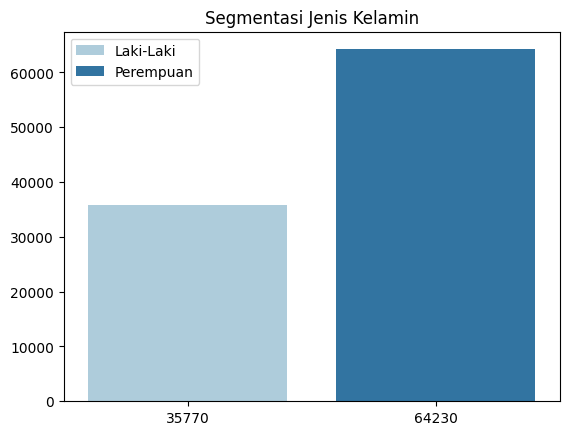

In [ ]:
# Visualisasi Segmentasi Transaksi Customer Berdasarkan Jenis Kelamin
import seaborn as sns

cols = ['grey' if (x < max(df_c.gender)) else 'orange' for x in df_c.gender]

sns.barplot(data=df_c, x=segmentasi_gender, y=segmentasi_gender, hue=segmentasi_gender,dodge=False, errorbar=None, palette='Paired').set(title='Segmentasi Jenis Kelamin')
plt.legend(loc='upper left', labels = ['Laki-Laki', 'Perempuan'])

plt.show()

In [ ]:
# Segmentasi Transaksi Customer Berdasarkan Penggunaan Perangkat
segmentasi_device = df_c.value_counts(subset = ['device_type'])
segmentasi_device

device_type
Android        76637
iOS            23363
dtype: int64

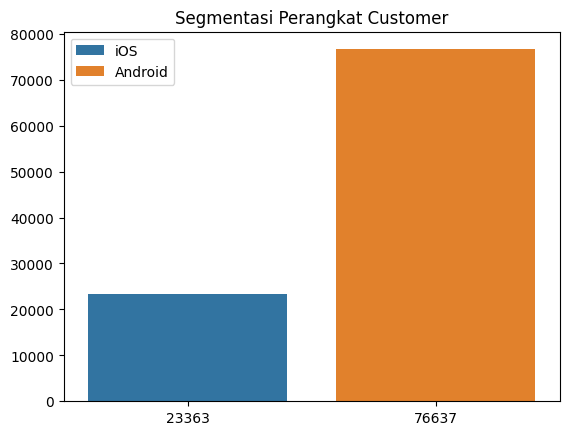

In [ ]:
# Visualisasi Segmentasi Perangkat Customer
sns.barplot(data=df_c, x=segmentasi_device, y=segmentasi_device, hue=segmentasi_device,dodge=False, errorbar=None).set(title='Segmentasi Perangkat Customer')
plt.legend(loc='upper left', labels = ['iOS', 'Android'])

plt.show()

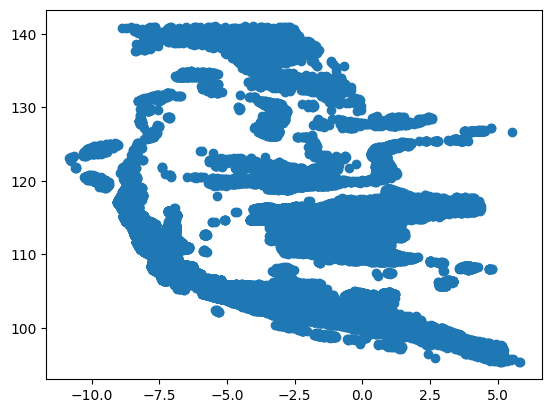

In [ ]:
# Visualisasi Lokasi Transaksi Customer Berdasarkan Garis Lintang dan Bujur (1)
plt.scatter(x=df_c['home_location_lat'], y=df_c['home_location_long'])
plt.show()

<ipython-input-13-0d365066dd13>:9: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


<Axes: >

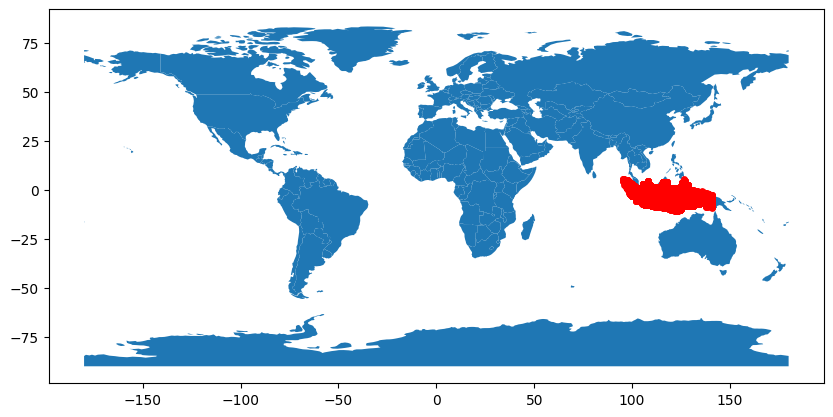

In [ ]:
# Visualisasi Lokasi Transaksi Customer Berdasarkan Garis Lintang dan Bujur (2)
from shapely.geometry import Point
import geopandas as gpd
from geopandas import GeoDataFrame

geometry = [Point(xy) for xy in zip(df_c['home_location_long'], df_c['home_location_lat'])]
gdf = GeoDataFrame(df_c, geometry=geometry)

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
gdf.plot(ax=world.plot(figsize=(10, 6)), marker='o', color='red', markersize=15)

In [ ]:
# Visualisasi Lokasi Transaksi Customer Berdasarkan Garis Lintang dan Bujur (3)
import plotly.express as px

df_c.dropna(
    axis=0,
    subset=None,
    inplace=True
)

color_scale = [(0, 'orange'), (1,'red')]

fig = px.scatter_mapbox(df_c,
                        lat="home_location_lat",
                        lon="home_location_long",
                        hover_name="home_location",
                        hover_data=["home_location"],
                        color_continuous_scale=color_scale,
                        zoom=8,
                        height=800,
                        width=800)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
# Mengubah tipe data kolom pada dataset customer

# kolom customer_id diubah menjadi bertipe object
df_c['customer_id'] = df_c['customer_id'].astype('object')

# kolom birthdate dan kolom first_join_date diubah menjadi bertipe datetime
df_c['birthdate'] = pd.to_datetime(df_c['birthdate'])
df_c['first_join_date'] = pd.to_datetime(df_c['first_join_date'])

In [ ]:
# Mengidentifikasi data duplikat pada dataset customer
df_c.duplicated().sum()

0

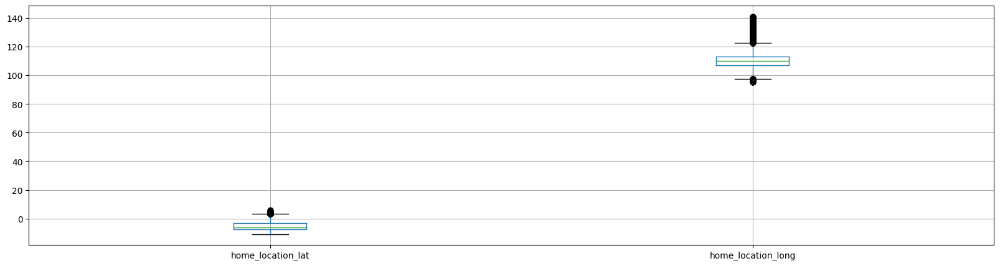

In [ ]:
# Mengidentifikasi data outlier pada dataset customer
plt.figure(figsize=(20, 5))
boxplot = df_c.boxplot(vert=True)

**DATASET TRANSACTION**

In [ ]:
# Mengimpor dataset transaction
df_t = pd.read_csv('/content/drive/MyDrive/Final Project/transactions.csv')

# Menampilkan 5 data teratas dari dataset transaction
df_t.head()

,created_at,customer_id,booking_id,session_id,product_metadata,payment_method,payment_status,promo_amount,promo_code,shipment_fee,shipment_date_limit,shipment_location_lat,shipment_location_long,total_amount
0,2018-07-29T15:22:01.458193Z,5868,186e2bee-0637-4710-8981-50c2d737bc42,3abaa6ce-e320-4e51-9469-d9f3fa328e86,"[{'product_id': 54728, 'quantity': 1, 'item_pr...",Debit Card,Success,1415,WEEKENDSERU,10000,2018-08-03T05:07:24.812676Z,-8.227893,111.969107,199832
1,2018-07-30T12:40:22.365620Z,4774,caadb57b-e808-4f94-9e96-8a7d4c9898db,2ee5ead1-f13e-4759-92df-7ff48475e970,"[{'product_id': 16193, 'quantity': 1, 'item_pr...",Credit Card,Success,0,NaN,10000,2018-08-03T01:29:03.415705Z,3.013470,107.802514,155526
2,2018-09-15T11:51:17.365620Z,4774,6000fffb-9c1a-4f4a-9296-bc8f6b622b50,93325fb6-eb00-4268-bb0e-6471795a0ad0,"[{'product_id': 53686, 'quantity': 4, 'item_pr...",OVO,Success,0,NaN,10000,2018-09-18T08:41:49.422380Z,-2.579428,115.743885,550696
3,2018-11-01T11:23:48.365620Z,4774,f5e530a7-4350-4cd1-a3bc-525b5037bcab,bcad5a61-1b67-448d-8ff4-781d67bc56e4,"[{'product_id': 20228, 'quantity': 1, 'item_pr...",Credit Card,Success,0,NaN,0,2018-11-05T17:42:27.954235Z,-3.602334,120.363824,271012
4,2018-12-18T11:20:30.365620Z,4774,0efc0594-dbbf-4f9a-b0b0-a488cfddf8a2,df1042ab-13e6-4072-b9d2-64a81974c51a,"[{'product_id': 55220, 'quantity': 1, 'item_pr...",Credit Card,Success,0,NaN,0,2018-12-23T17:24:07.361785Z,-3.602334,120.363824,198753


In [ ]:
# Mengidentifikasi jumlah baris dan kolom, tipe data, dan missing value pada dataset transaction
df_t.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 852584 entries, 0 to 852583
Data columns (total 14 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   created_at              852584 non-null  object 
 1   customer_id             852584 non-null  int64  
 2   booking_id              852584 non-null  object 
 3   session_id              852584 non-null  object 
 4   product_metadata        852584 non-null  object 
 5   payment_method          852584 non-null  object 
 6   payment_status          852584 non-null  object 
 7   promo_amount            852584 non-null  int64  
 8   promo_code              326536 non-null  object 
 9   shipment_fee            852584 non-null  int64  
 10  shipment_date_limit     852584 non-null  object 
 11  shipment_location_lat   852584 non-null  float64
 12  shipment_location_long  852584 non-null  float64
 13  total_amount            852584 non-null  int64  
dtypes: float64(2), int64

In [ ]:
# Mengubah tipe data kolom pada dataset transaction

# kolom created_at menjadi bertipe datetime dan ekstrak hanya tanggalnya saja
df_t['created_at'] = pd.to_datetime(df_t['created_at'])
df_t['created_at_date']= df_t['created_at'].dt.date # membuat kolom baru bernama created_at_date untuk menyimpan tanggal transaksi

# kolom created_at_date menjadi bertipe datetime
df_t['created_at_date'] = pd.to_datetime(df_t['created_at_date'])

# kolom customer_id menjadi bertipe object
df_t['customer_id'] = df_t['customer_id'].astype('object')

In [ ]:
# Menangani missing value kolom promo_code pada dataset transaction
df_t['promo_code'].fillna('NaN', inplace=True)

In [ ]:
# Mengahpus kolom-kolom yang tidak diperlukan
df_t.drop(columns=['created_at', 'shipment_date_limit', 'shipment_location_lat', 'shipment_location_long'], inplace = True)

In [ ]:
df_t.head()

,customer_id,booking_id,session_id,product_metadata,payment_method,payment_status,promo_amount,promo_code,shipment_fee,total_amount,created_at_date
0,5868,186e2bee-0637-4710-8981-50c2d737bc42,3abaa6ce-e320-4e51-9469-d9f3fa328e86,"[{'product_id': 54728, 'quantity': 1, 'item_pr...",Debit Card,Success,1415,WEEKENDSERU,10000,199832,2018-07-29
1,4774,caadb57b-e808-4f94-9e96-8a7d4c9898db,2ee5ead1-f13e-4759-92df-7ff48475e970,"[{'product_id': 16193, 'quantity': 1, 'item_pr...",Credit Card,Success,0,NaN,10000,155526,2018-07-30
2,4774,6000fffb-9c1a-4f4a-9296-bc8f6b622b50,93325fb6-eb00-4268-bb0e-6471795a0ad0,"[{'product_id': 53686, 'quantity': 4, 'item_pr...",OVO,Success,0,NaN,10000,550696,2018-09-15
3,4774,f5e530a7-4350-4cd1-a3bc-525b5037bcab,bcad5a61-1b67-448d-8ff4-781d67bc56e4,"[{'product_id': 20228, 'quantity': 1, 'item_pr...",Credit Card,Success,0,NaN,0,271012,2018-11-01
4,4774,0efc0594-dbbf-4f9a-b0b0-a488cfddf8a2,df1042ab-13e6-4072-b9d2-64a81974c51a,"[{'product_id': 55220, 'quantity': 1, 'item_pr...",Credit Card,Success,0,NaN,0,198753,2018-12-18


In [ ]:
df_t.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 852584 entries, 0 to 852583
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   customer_id       852584 non-null  object        
 1   booking_id        852584 non-null  object        
 2   session_id        852584 non-null  object        
 3   product_metadata  852584 non-null  object        
 4   payment_method    852584 non-null  object        
 5   payment_status    852584 non-null  object        
 6   promo_amount      852584 non-null  int64         
 7   promo_code        852584 non-null  object        
 8   shipment_fee      852584 non-null  int64         
 9   total_amount      852584 non-null  int64         
 10  created_at_date   852584 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int64(3), object(7)
memory usage: 71.6+ MB


In [ ]:
# Mengidentifikasi data duplikat pada dataset transaction
df_t.duplicated().sum()

0

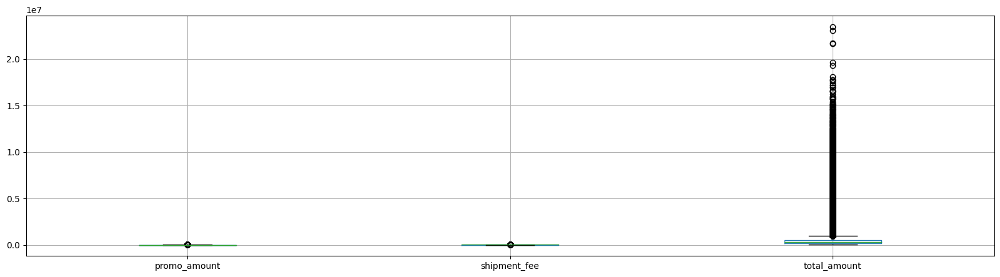

In [ ]:
# Mengidentifikasi data outlier pada dataset transaction
plt.figure(figsize=(20, 5))
boxplot = df_t.boxplot(vert=True)

###Feature Engineering

**DATASET CUSTOMER**

In [ ]:
# Membuat kolom baru bernama age
from datetime import datetime
df_c['age'] = (datetime.now() - df_c['birthdate']).astype('<m8[Y]').astype('int64')

# Menghapus kolom birthdate
df_c = df_c.drop('birthdate', axis=1)

In [ ]:
# Melakukan one hot encoding kolom gender pada dataset customer
df_c = pd.get_dummies(df_c, columns=['gender'], prefix=['gender'])

In [ ]:
df_c.head()

,customer_id,first_name,last_name,username,email,device_type,device_id,device_version,home_location_lat,home_location_long,home_location,home_country,first_join_date,age,gender_F,gender_M
0,2870,Lala,Maryati,671a0865-ac4e-4dc4-9c4f-c286a1176f7e,671a0865_ac4e_4dc4_9c4f_c286a1176f7e@startupca...,iOS,c9c0de76-0a6c-4ac2-843f-65264ab9fe63,iPhone; CPU iPhone OS 14_2_1 like Mac OS X,-1.043345,101.360523,Sumatera Barat,Indonesia,2019-07-21,27,1,0
1,8193,Maimunah,Laksmiwati,83be2ba7-8133-48a4-bbcb-b46a2762473f,83be2ba7_8133_48a4_bbcb_b46a2762473f@zakyfound...,Android,fb331c3d-f42e-40fe-afe2-b4b73a8a6e25,Android 2.2.1,-6.212489,106.818850,Jakarta Raya,Indonesia,2017-07-16,30,1,0
2,7279,Bakiman,Simanjuntak,3250e5a3-1d23-4675-a647-3281879d42be,3250e5a3_1d23_4675_a647_3281879d42be@startupca...,iOS,d13dde0a-6ae1-43c3-83a7-11bbb922730b,iPad; CPU iPad OS 4_2_1 like Mac OS X,-8.631607,116.428436,Nusa Tenggara Barat,Indonesia,2020-08-23,34,0,1
3,88813,Cahyadi,Maheswara,df797edf-b465-4a80-973b-9fbb612260c2,df797edf_b465_4a80_973b_9fbb612260c2@zakyfound...,iOS,f4c18515-c5be-419f-8142-f037be47c9cd,iPad; CPU iPad OS 14_2 like Mac OS X,1.299332,115.774934,Kalimantan Timur,Indonesia,2021-10-03,32,0,1
4,82542,Irnanto,Wijaya,36ab08e1-03de-42a8-9e3b-59528c798824,36ab08e1_03de_42a8_9e3b_59528c798824@startupca...,iOS,e46e4c36-4630-4736-8fcf-663db29ca3b0,iPhone; CPU iPhone OS 10_3_3 like Mac OS X,-2.980807,114.924675,Kalimantan Selatan,Indonesia,2021-04-11,23,0,1


In [ ]:
df_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 16 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   customer_id         100000 non-null  object        
 1   first_name          100000 non-null  object        
 2   last_name           100000 non-null  object        
 3   username            100000 non-null  object        
 4   email               100000 non-null  object        
 5   device_type         100000 non-null  object        
 6   device_id           100000 non-null  object        
 7   device_version      100000 non-null  object        
 8   home_location_lat   100000 non-null  float64       
 9   home_location_long  100000 non-null  float64       
 10  home_location       100000 non-null  object        
 11  home_country        100000 non-null  object        
 12  first_join_date     100000 non-null  datetime64[ns]
 13  age                 100000 non

In [ ]:
# Mengidentifikasi data duplikat pada dataset customer
df_c.duplicated().sum()

0

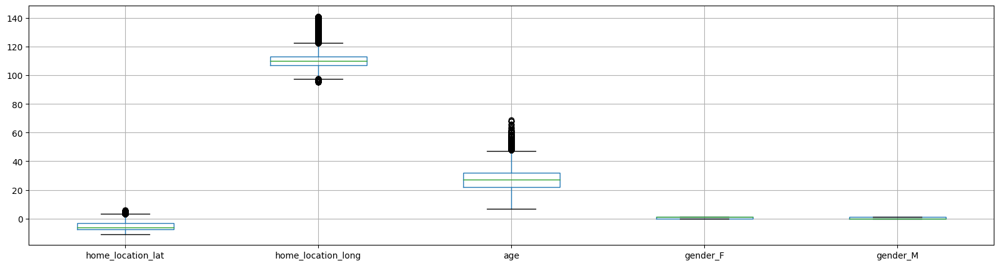

In [ ]:
# Mengidentifikasi data outlier pada dataset customer
plt.figure(figsize=(20, 5))
boxplot = df_c.boxplot(vert=True)

**DATASET TRANSACTION**

In [ ]:
# Membuat kolom baru bernama total_item dengan menjumlahkan quantity pada kolom product_metadata
import json

def hitung_total_item(x):
  total_item = 0
  for product in x:
    total_item += product['quantity']
  return total_item

# Mengubah tanda petik tunggal (' ') menjadi petik ganda (" ")
df_t['product_metadata'] = df_t['product_metadata'].str.replace("'", "\"")
# Mengubah nilai string JSON menjadi dictionary
df_t['product_metadata'] = df_t['product_metadata'].apply(lambda x: json.loads(x))

df_t['total_item'] = df_t['product_metadata'].apply(lambda x: hitung_total_item(x))

# Menghapus kolom 'product_metadata'
df_t = df_t.drop('product_metadata', axis=1)

**MENGELOMPOKKAN TOTAL TRANSAKSI, TOTAL TRANSAKSI YANG SUKSES, DAN TOTAL TRANSAKSI YANG GAGAL UNTUK SETIAP PELANGGAN**

In [ ]:
# Mengelompokkan total transaksi customer
total_transaction = df_t.groupby("customer_id")["booking_id"].count().reset_index(name="total_transaction")

# Mengelompokkan total transaksi customer yang sukses
total_transaction_success = df_t[df_t["payment_status"]=="Success"].groupby("customer_id")["booking_id"].count().reset_index(name="total_transaction_success")

# Mengelompokkan total transaksi customer yang gagal
total_transaction_failed = df_t[df_t["payment_status"]=="Failed"].groupby("customer_id")["booking_id"].count().reset_index(name="total_transaction_failed")

# Menggabungkan ketiga pengelompokkan
transaction_customer = total_transaction.merge(total_transaction_success, on="customer_id", how="left")
transaction_customer = transaction_customer.merge(total_transaction_failed, on="customer_id", how="left")

# Menggantikan nilai-nilai yang kosong dengan 0
transaction_customer = transaction_customer.fillna(0)

# Mengubah tipe data kolom total_transaction_success dan kolom total_transaction_failed menjadi bertipe integer
transaction_customer['total_transaction_success'] = transaction_customer['total_transaction_success'].astype(int)
transaction_customer['total_transaction_failed'] = transaction_customer['total_transaction_failed'].astype(int)

transaction_customer

,customer_id,total_transaction,total_transaction_success,total_transaction_failed
0,3,51,49,2
1,8,7,7,0
2,9,6,6,0
3,11,1,1,0
4,15,5,5,0
...,...,...,...,...
50700,99992,12,12,0
50701,99995,60,59,1
50702,99997,1,1,0
50703,99998,8,8,0


**MENGELOMPOKKAN RFM UNTUK SETIAP PELANGGAN**

In [ ]:
# RFM (Recency, Frequency, Moneter)

""" Recency (R): Metrik ini menunjukkan seberapa sering customer melakukan transaksi.
Nilai recency yang lebih rendah berarti customer melakukan transaksi baru-baru ini. """
# Mengidentifikasi transaksi terakhir yang dilakukan setiap pelanggan
rfm_customer = df_t.groupby('customer_id')['created_at_date'].max().reset_index()

# Mengidentifikasi transasksi terakhir pada dataset
most_recent_date = df_t['created_at_date'].max()
# Mengubah tipe data kolom tmost_recent_date menjadi bertipe integer
most_recent_date = pd.to_datetime(most_recent_date)

# Menghitung jumlah hari sejak transaksi terakhir untuk setiap pelanggan
rfm_customer['days_since_last_purchase'] = (most_recent_date - rfm_customer['created_at_date']).dt.days
rfm_customer.drop(columns=['created_at_date'], inplace=True)

""" Frekuensi (F): Metrik ini menandakan seberapa sering pelanggan melakukan transaksi dalam periode tertentu.
Nilai frekuensi yang lebih tinggi menunjukkan pelanggan yang lebih sering berinteraksi dengan bisnis, menunjukkan loyalitas atau kepuasan yang lebih tinggi."""
# Menhitung total transaksi yang dilakukan setiap pelanggan
total_transactions = df_t.groupby('customer_id')['booking_id'].nunique().reset_index()
total_transactions.rename(columns={'booking_id': 'total_transaction'}, inplace=True)

# Menghitung total produk yang dibeli oleh setiap pelanggan
total_products_purchased = df_t.groupby('customer_id')['total_item'].sum().reset_index()
total_products_purchased.rename(columns={'total_item': 'total_products_purchased'}, inplace=True)

# Menggabungkan kedua perhitungan di atas
rfm_customer = pd.merge(rfm_customer, total_transactions, on='customer_id')
rfm_customer = pd.merge(rfm_customer, total_products_purchased, on='customer_id')

""" Moneter (M): Metrik ini menunjukkan total uang yang dibelanjakan pelanggan selama periode tertentu.
Pelanggan yang memiliki nilai moneter yang lebih tinggi telah memberikan kontribusi lebih banyak kepada bisnis, yang mengindikasikan potensi nilai seumur hidup yang tinggi. """
# Mengelompokkan total pengeluaran setiap pelanggan
total_spend = df_t.groupby('customer_id')['total_amount'].sum().reset_index()

# Menghitung rata-rata transaksi untuk setiap pelanggan
average_transaction_value = total_spend.merge(total_transactions, on='customer_id')
average_transaction_value['average_transaction_value'] = average_transaction_value['total_amount'] / average_transaction_value['total_transaction']

# Menggabungkan kedua perhitungan di atas
rfm_customer = pd.merge(rfm_customer, total_spend, on='customer_id')
rfm_customer = pd.merge(rfm_customer, average_transaction_value[['customer_id', 'average_transaction_value']], on='customer_id')

rfm_customer

,customer_id,days_since_last_purchase,total_transaction,total_products_purchased,total_amount,average_transaction_value
0,3,35,51,88,21265889,416978.215686
1,8,77,7,19,3898561,556937.285714
2,9,64,6,10,2638665,439777.500000
3,11,146,1,1,197533,197533.000000
4,15,207,5,9,2134870,426974.000000
...,...,...,...,...,...,...
50700,99992,67,12,19,4352229,362685.750000
50701,99995,2,60,134,36043743,600729.050000
50702,99997,827,1,1,226461,226461.000000
50703,99998,187,8,33,6692540,836567.500000


###Merge Datasets

In [ ]:
# Menggabungkan dataset customer dan dataset rfm_customer
df_merge_rfmc = pd.merge(df_c, rfm_customer, left_on='customer_id', right_on='customer_id', how='inner')

In [ ]:
df_merge_rfmc.head()

,customer_id,first_name,last_name,username,email,device_type,device_id,device_version,home_location_lat,home_location_long,...,home_country,first_join_date,age,gender_F,gender_M,days_since_last_purchase,total_transaction,total_products_purchased,total_amount,average_transaction_value
0,7279,Bakiman,Simanjuntak,3250e5a3-1d23-4675-a647-3281879d42be,3250e5a3_1d23_4675_a647_3281879d42be@startupca...,iOS,d13dde0a-6ae1-43c3-83a7-11bbb922730b,iPad; CPU iPad OS 4_2_1 like Mac OS X,-8.631607,116.428436,...,Indonesia,2020-08-23,34,0,1,2,89,204,48693665,547119.831461
1,82542,Irnanto,Wijaya,36ab08e1-03de-42a8-9e3b-59528c798824,36ab08e1_03de_42a8_9e3b_59528c798824@startupca...,iOS,e46e4c36-4630-4736-8fcf-663db29ca3b0,iPhone; CPU iPhone OS 10_3_3 like Mac OS X,-2.980807,114.924675,...,Indonesia,2021-04-11,23,0,1,471,1,1,115702,115702.000000
2,96453,Talia,Hastuti,44e67d0f-4743-479c-a74b-fc853ea5b355,44e67d0f_4743_479c_a74b_fc853ea5b355@startupca...,Android,eba4a196-7133-4da6-a2b4-d153541edc5b,Android 4.2,-3.908257,102.486909,...,Indonesia,2022-01-09,18,1,0,100,2,2,400724,200362.000000
3,8031,Ana,Laksmiwati,c5969dbf-c32b-428c-b8f4-a430def3befd,c5969dbf_c32b_428c_b8f4_a430def3befd@zakyfound...,iOS,17545c14-a543-43ab-8e30-f9195f0336f0,iPad; CPU iPad OS 10_3_3 like Mac OS X,-6.974594,107.634488,...,Indonesia,2019-09-12,28,1,0,347,3,8,2332833,777611.000000
4,9152,Olivia,Hariyah,9f6bf5e5-c8dc-4684-a258-4ebf4416c519,9f6bf5e5_c8dc_4684_a258_4ebf4416c519@startupca...,iOS,33aaf2ae-54c2-45ef-a499-743413c32952,iPad; CPU iPad OS 4_2_1 like Mac OS X,-7.885658,110.042265,...,Indonesia,2019-11-21,27,1,0,327,3,3,521337,173779.000000


In [ ]:
df_merge_rfmc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50705 entries, 0 to 50704
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   customer_id                50705 non-null  object        
 1   first_name                 50705 non-null  object        
 2   last_name                  50705 non-null  object        
 3   username                   50705 non-null  object        
 4   email                      50705 non-null  object        
 5   device_type                50705 non-null  object        
 6   device_id                  50705 non-null  object        
 7   device_version             50705 non-null  object        
 8   home_location_lat          50705 non-null  float64       
 9   home_location_long         50705 non-null  float64       
 10  home_location              50705 non-null  object        
 11  home_country               50705 non-null  object        
 12  firs

In [ ]:
# Mengidentifikasi data duplikat pada dataset transaction
df_merge_rfmc.duplicated().sum()

0

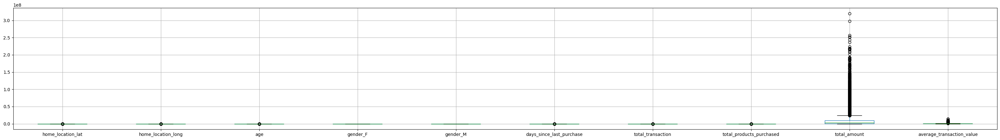

In [ ]:
# Mengidentifikasi data outlier pada dataset customer
plt.figure(figsize=(40, 5))
boxplot = df_merge_rfmc.boxplot(vert=True)

###EDA

In [ ]:
df_merge_rfmc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50705 entries, 0 to 50704
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   customer_id                50705 non-null  object        
 1   first_name                 50705 non-null  object        
 2   last_name                  50705 non-null  object        
 3   username                   50705 non-null  object        
 4   email                      50705 non-null  object        
 5   device_type                50705 non-null  object        
 6   device_id                  50705 non-null  object        
 7   device_version             50705 non-null  object        
 8   home_location_lat          50705 non-null  float64       
 9   home_location_long         50705 non-null  float64       
 10  home_location              50705 non-null  object        
 11  home_country               50705 non-null  object        
 12  firs

In [ ]:
# Import
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

**Summary Statistics**

In [ ]:
#Summary Statistics
# Pilih kolom-kolom numerik
numeric_columns = ['age', 'days_since_last_purchase', 'total_transaction', 'total_products_purchased', 'total_amount', 'average_transaction_value']

# Hitung ringkasan statistik deskriptif
summary_statistics = df_merge_rfmc[numeric_columns].describe()

# Tampilkan ringkasan statistik deskriptif
summary_statistics

,age,days_since_last_purchase,total_transaction,total_products_purchased,total_amount,average_transaction_value
count,50705.000000,50705.000000,50705.000000,50705.000000,5.070500e+04,5.070500e+04
mean,27.450606,299.083384,16.814594,36.498846,9.246623e+06,5.484178e+05
std,7.268433,436.187195,29.711045,65.676967,1.666054e+07,4.599319e+05
min,7.000000,0.000000,1.000000,1.000000,2.745000e+04,2.745000e+04
25%,22.000000,39.000000,2.000000,3.000000,7.871200e+05,3.176578e+05
50%,27.000000,110.000000,6.000000,12.000000,3.094260e+06,4.613613e+05
75%,32.000000,359.000000,18.000000,40.000000,1.013354e+07,6.243970e+05
max,69.000000,2221.000000,550.000000,1259.000000,3.200618e+08,1.390450e+07


**Distribusi Data**

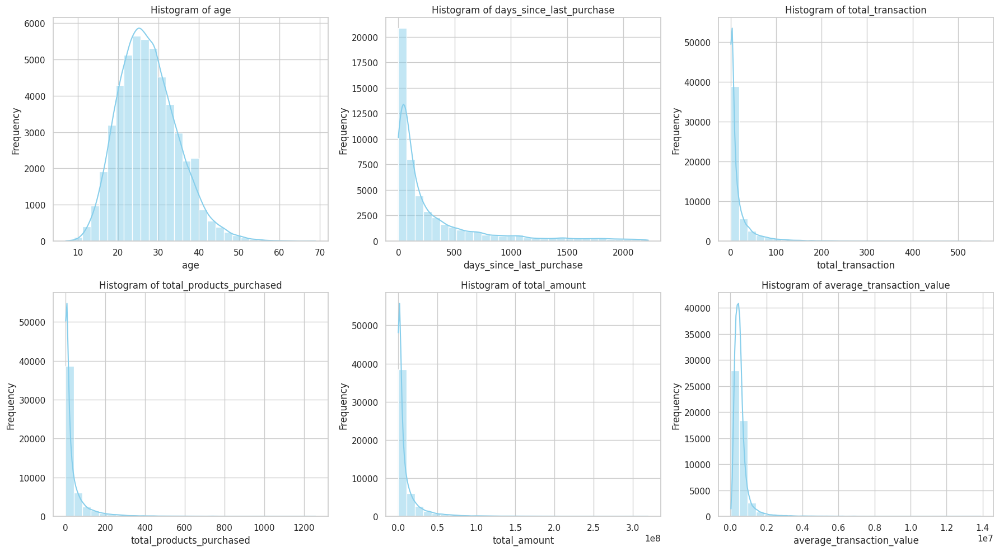

In [ ]:
# Distribusi Data
# Pengaturan estetika seaborn
sns.set(style="whitegrid")

# Membuat subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))

# Melakukan plotting histogram untuk setiap variabel numerik
for i, col in enumerate(numeric_columns):
    sns.histplot(df_merge_rfmc[col], bins=30, kde=True, ax=axes[i//3, i%3], color='skyblue')
    axes[i//3, i%3].set_title(f'Histogram of {col}')
    axes[i//3, i%3].set_xlabel(col)
    axes[i//3, i%3].set_ylabel('Frequency')

# Menyesuaikan layout
plt.tight_layout()
plt.show()

**Korelasi**

<ipython-input-45-f4860ae98194>:4: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



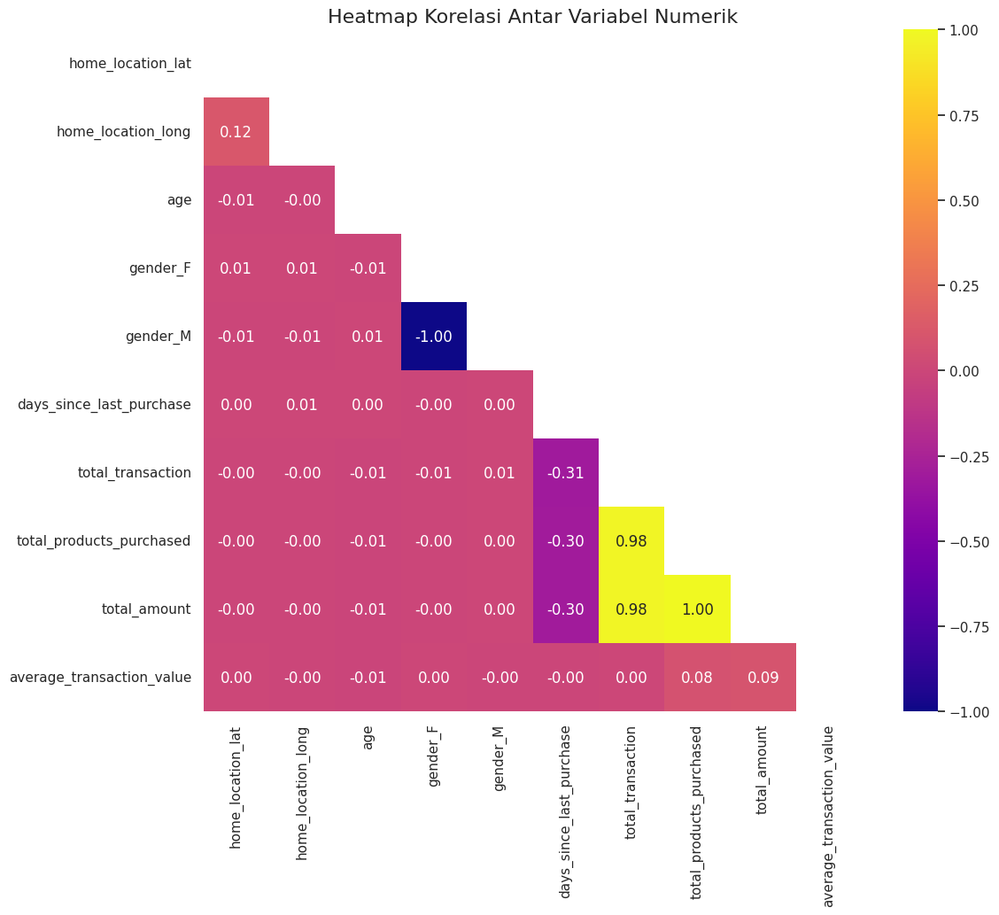

In [ ]:
# Korelasi

# Menghitung korelasi antar variabel
correlation_matrix = df_merge_rfmc.corr()

# Mengatur estetika seaborn
sns.set(style="white")

# Membuat mask untuk memasukkan segitiga atas dari heatmap
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Menyesuaikan ukuran plot
plt.figure(figsize=(12, 10))

# Membuat heatmap
sns.heatmap(correlation_matrix, mask=mask, annot=True, fmt=".2f", cmap="plasma", vmin=-1, vmax=1)

# Menyesuaikan layout
plt.title("Heatmap Korelasi Antar Variabel Numerik", fontsize=16)
plt.show()

1. Days Since Last Purchase:

Korelasi negatif yang signifikan dengan total_transaction, total_products_purchased, dan total_amount menunjukkan bahwa semakin lama waktu sejak pembelian terakhir, jumlah transaksi, produk yang dibeli, dan total uang yang dihabiskan cenderung lebih rendah.

2. Total Transaction & Total Products Purchased:

Korelasi yang sangat erat (0.98) antara keduanya menunjukkan bahwa kenaikan dalam jumlah transaksi berdampak sejalan dengan peningkatan jumlah produk yang dibeli.

3. Total Amount:

Korelasi yang kuat (0.98) dengan total_transaction dan total_products_purchased menunjukkan bahwa semakin besar jumlah transaksi atau produk yang dibeli, semakin tinggi total jumlah uang yang dihabiskan.

**Distribusi Gender**

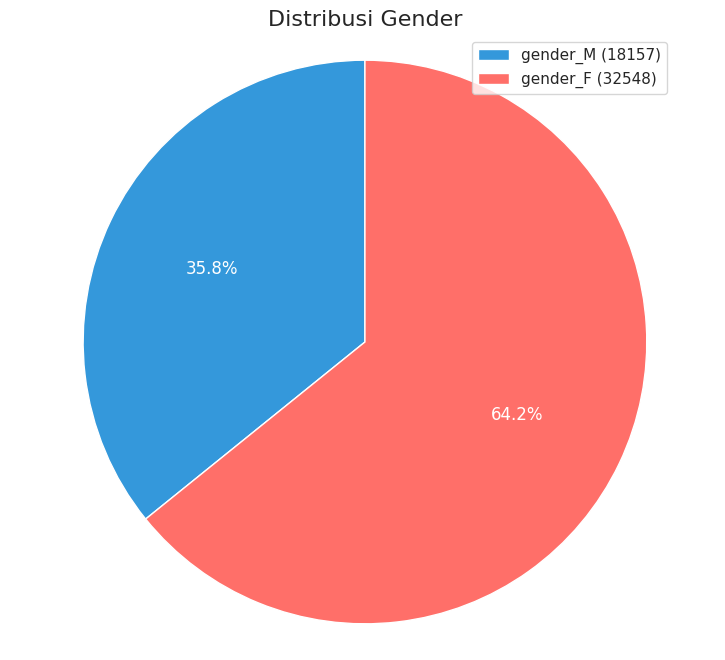

In [ ]:
# Distribusi Gender
# Menghitung jumlah masing-masing gender
gender_count = df_merge_rfmc[['gender_M', 'gender_F']].sum()

# Membuat pie chart dengan warna yang berbeda untuk setiap gender
colors = ['#3498db', '#ff6f69']
plt.figure(figsize=(8, 8))
patches, texts, autotexts = plt.pie(gender_count, labels=gender_count.index, autopct='%1.1f%%', colors=colors, startangle=90, textprops=dict(color="w"))

# Menambahkan label frekuensi di sebelah pie chart
plt.legend(patches, [f'{label} ({count})' for label, count in zip(gender_count.index, gender_count)], loc="upper right")
plt.title('Distribusi Gender', fontsize=16)

# Menyesuaikan layout
plt.axis('equal')  # Untuk membuat pie chart terlihat seperti lingkaran
plt.show()

Dataset menunjukkan perbandingan pelanggan perempuan (64.2%) lebih tinggi dibanding pelanggan laki-laki (35.8%). Proporsi ini dapat menjadi landasan untuk penyesuaian strategi pemasaran yang lebih terfokus atau segmentasi pasar yang lebih baik antara kedua gender.

**Distribusi Umur**

In [ ]:
# Distribusi Umur
# Kategorisasi umur untuk Remaja, Dewasa, dan Lansia
bins = [6, 12, 26, 46, 66]  # Menentukan batas umur untuk remaja, dewasa, dan lansia
labels = ['Anak-anak', 'Remaja', 'Dewasa', 'Lansia']

# Menambahkan kolom baru 'age_group' ke dalam DataFrame
df_merge_rfmc['age_group'] = pd.cut(df_merge_rfmc['age'], bins=bins, labels=labels, right=False)

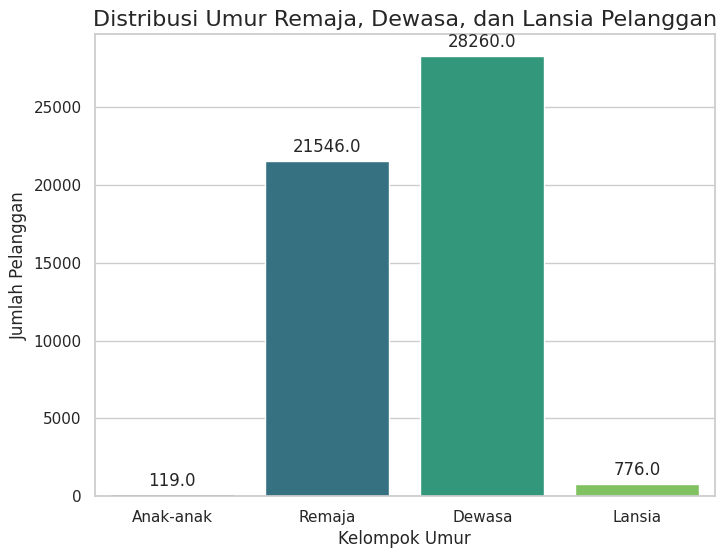

In [ ]:
# Mengatur estetika seaborn
sns.set(style="whitegrid")

# Menyesuaikan ukuran plot
plt.figure(figsize=(8, 6))

# Membuat bar chart
ax = sns.countplot(x='age_group', data=df_merge_rfmc, palette='viridis')

# Menambahkan judul dan label
plt.title("Distribusi Umur Remaja, Dewasa, dan Lansia Pelanggan", fontsize=16)
plt.xlabel("Kelompok Umur")
plt.ylabel("Jumlah Pelanggan")

# Menambahkan anotasi di atas bar
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

# Menampilkan plot
plt.show()

1. Dominasi Kelompok Usia Dewasa dan Remaja:

Mayoritas pelanggan tergolong dalam kelompok usia dewasa dan remaja. Ini menandakan bahwa pasar terbesar terdiri dari mereka yang berusia dewasa dan remaja.

2. Potensi Fokus Pemasaran pada Kelompok Usia Tertentu:

Dengan jumlah pelanggan yang signifikan dalam kelompok usia dewasa dan remaja, ada peluang besar untuk menyusun strategi pemasaran yang lebih spesifik dan relevan untuk kedua kelompok ini.

3. Perhatian Terhadap Kelompok Minoritas (Anak-anak dan Lansia):

Meskipun jumlahnya lebih sedikit, tetap penting untuk memperhatikan kelompok minoritas seperti anak-anak dan lansia. Strategi khusus dapat dikembangkan untuk menarik perhatian dan memenuhi kebutuhan mereka.

**Device Type**

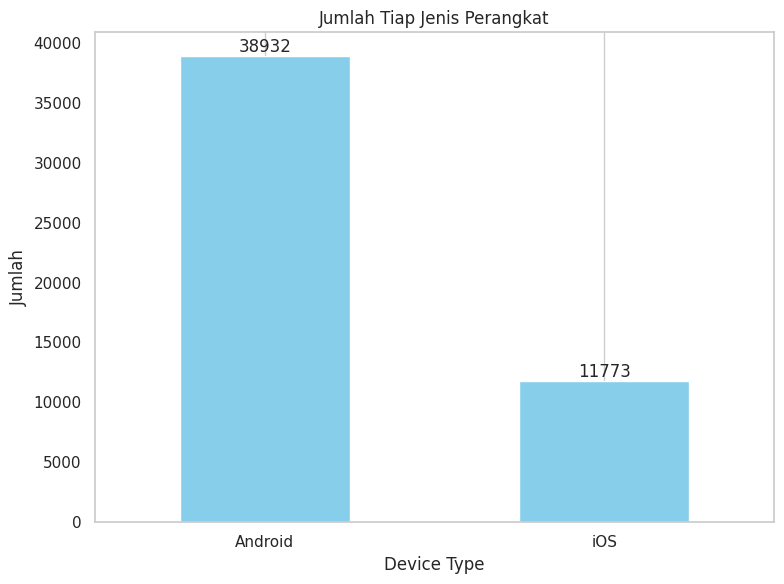

In [ ]:
import matplotlib.pyplot as plt

device = df_merge_rfmc['device_type'].value_counts()

plt.figure(figsize=(8, 6))
device_plot = device.plot(kind='bar', color='skyblue')

plt.title('Jumlah Tiap Jenis Perangkat')
plt.xlabel('Device Type')
plt.ylabel('Jumlah')
plt.xticks(rotation=0)  # Mengatur rotasi label sumbu x menjadi 0 derajat
plt.grid(axis='y')
plt.grid(False, axis='y')  # Menghilangkan garis grid di sumbu y

# Menambahkan teks nilai frekuensi di atas setiap batang
for i, value in enumerate(device):
    plt.text(i, value + 0.1, str(value), ha='center', va='bottom')

plt.tight_layout()
plt.show()



Terdapat perbedaan yang mencolok antara jumlah pengguna Android dan iOS dalam data yang terkumpul. Android mendominasi pangsa pasar perangkat dengan jumlah pengguna yang jauh lebih besar dibandingkan dengan iOS. Analisis lebih lanjut terhadap preferensi pengguna di setiap platform dapat memberikan wawasan yang berharga dalam mengembangkan strategi pemasaran dan pengembangan aplikasi yang lebih tepat sasaran. Kesenjangan jumlah ini juga mengindikasikan potensi peluang pertumbuhan yang lebih besar di satu platform dan kemungkinan area yang memerlukan peningkatan di platform lainnya.

**Distribusi Wilayah**

In [ ]:
# Distribusi Wilayah
import plotly.express as px

fig = px.scatter_mapbox(
    df_merge_rfmc,
    lat='home_location_lat',
    lon='home_location_long',
    text='home_location',  # Kolom dengan nama kota atau lokasi
    title='Distribusi Pelanggan di Indonesia'
)

fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_zoom=5,
    mapbox_center={"lat": -2.548926, "lon": 118.014863}  # Koordinat tengah peta
)

fig.show()

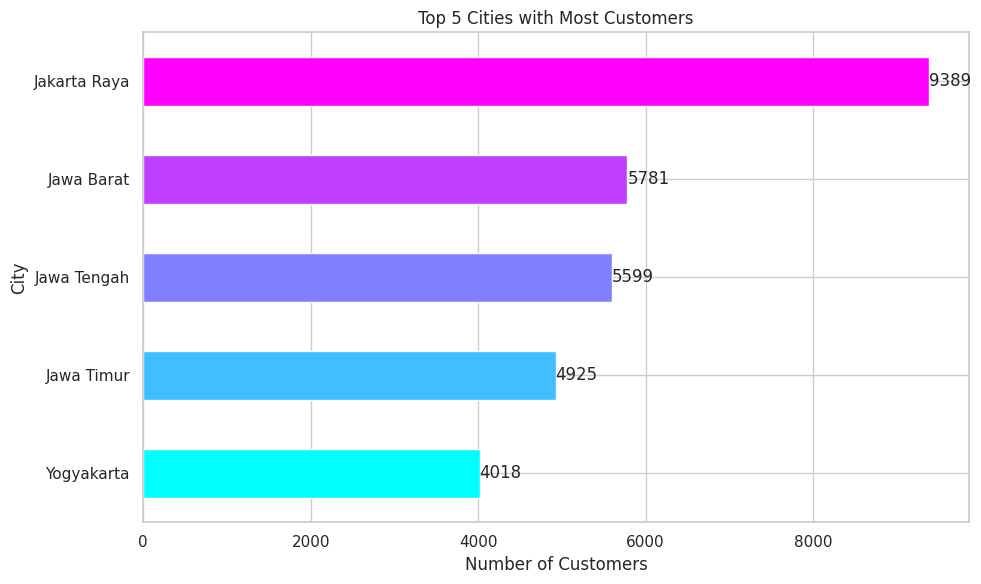

In [ ]:
# Menghitung jumlah pelanggan per kota
top_cities = df_merge_rfmc['home_location'].value_counts().head(5)

# Membuat gradient warna
colors = plt.cm.cool(np.linspace(0, 1, len(top_cities)))

# Membuat plot bar horizontal untuk 5 kota dengan pelanggan terbanyak dengan warna gradasi
plt.figure(figsize=(10, 6))
top_cities.sort_values().plot(kind='barh', color=colors)  # Menggunakan barh() untuk diagram batang horizontal

# Menambahkan judul dan label
plt.title('Top 5 Cities with Most Customers')
plt.xlabel('Number of Customers')
plt.ylabel('City')

# Menambahkan label untuk nilai di samping tiap bar
for i, value in enumerate(top_cities.sort_values()):
    plt.text(value, i, str(value), ha='left', va='center')

# Menampilkan plot
plt.tight_layout()
plt.show()

1. Dominasi Provinsi Jawa dalam Jumlah Pelanggan:

Tiga dari lima provinsi teratas dengan jumlah pelanggan tertinggi adalah provinsi di Pulau Jawa (Jakarta Raya, Jawa Barat, Jawa Tengah, Jawa Timur, dan Yogyakarta). Hal ini menandakan bahwa wilayah Jawa memiliki basis pelanggan yang kuat.

2. Peran Penting Wilayah Jakarta:

Jakarta Raya menonjol sebagai wilayah dengan jumlah pelanggan terbanyak, menunjukkan peran sentral Jakarta dalam pasar atau basis pelanggan suatu perusahaan.

3. Potensi Pengembangan Pasar di Luar Jawa:

Meskipun provinsi di Jawa mendominasi, adanya provinsi lain di luar Jawa yang tidak terdapat dalam lima teratas (seperti Sumatera, Kalimantan, Sulawesi, atau Papua) memberikan peluang untuk ekspansi dan pengembangan pasar di wilayah-wilayah tersebut.

4. Fokus Strategi Pemasaran:

Informasi ini dapat menjadi landasan untuk menyesuaikan strategi pemasaran, dengan lebih memfokuskan upaya pemasaran atau pengembangan produk pada wilayah-wilayah dengan jumlah pelanggan potensial yang tinggi.

**Trend Pengguna Baru Setiap Tahunya**

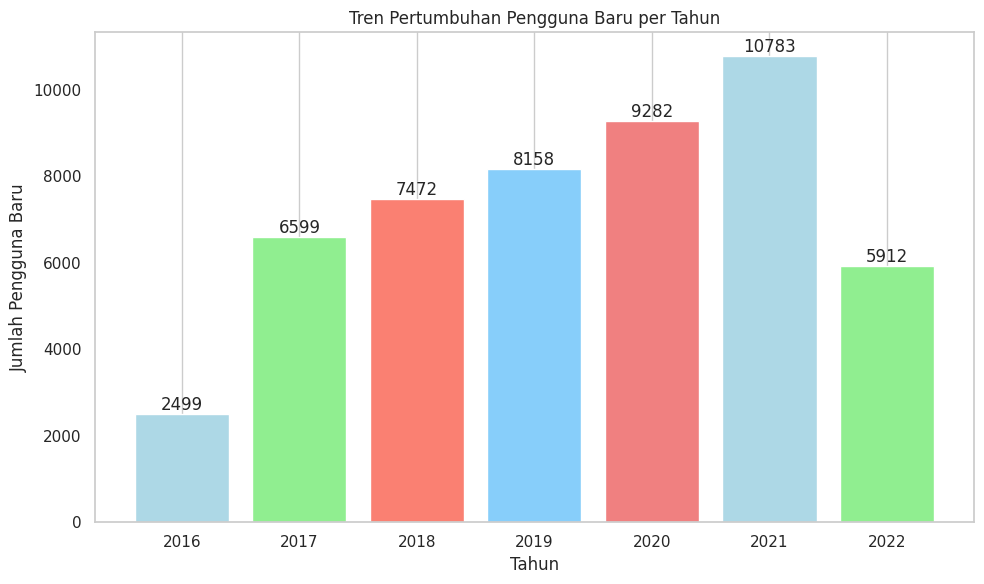

In [ ]:
# Menghitung jumlah pengguna baru per tahun tanpa menambah kolom baru
user_growth_per_year = df_merge_rfmc.groupby(df_merge_rfmc['first_join_date'].dt.year).size()

# Warna kustom untuk diagram batang
color_palette = ['lightblue', 'lightgreen', 'salmon', 'lightskyblue', 'lightcoral']

# Plotting tren pertumbuhan pengguna baru per tahun dengan label nilai frekuensi dan warna kustom
plt.figure(figsize=(10, 6))
bars = plt.bar(user_growth_per_year.index, user_growth_per_year, color=color_palette)
plt.title('Tren Pertumbuhan Pengguna Baru per Tahun')
plt.xlabel('Tahun')
plt.ylabel('Jumlah Pengguna Baru')
plt.xticks(user_growth_per_year.index)  # Mengatur label sumbu x berdasarkan tahun
plt.grid(axis='y')

# Menambahkan label nilai frekuensi di atas setiap batang
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), va='bottom', ha='center')

plt.tight_layout()
plt.show()


Dalam rentang waktu yang diamati, terdapat pola pertumbuhan yang tidak konsisten dalam jumlah pengguna baru per tahun. Terlihat adanya tren naik yang signifikan dari tahun 2016 hingga 2021, dengan lonjakan yang cukup tajam dari tahun ke tahun. Namun, terdapat penurunan yang tiba-tiba pada tahun 2022, yang menjadi poin menarik karena sebaliknya dari tren sebelumnya. Kemungkinan adanya faktor-faktor eksternal atau perubahan dalam strategi pemasaran yang memengaruhi tren pertumbuhan pengguna pada tahun tersebut. Kesimpulannya, tren pertumbuhan pengguna cenderung fluktuatif, dengan lonjakan signifikan di beberapa tahun tertentu yang diikuti oleh penurunan yang tiba-tiba pada tahun terakhir dalam rentang waktu tersebut.

###Based Modeling

In [ ]:
x = df_merge_rfmc[['total_amount', 'days_since_last_purchase', 'total_transaction']]
x.head()

,total_amount,days_since_last_purchase,total_transaction
0,48693665,2,89
1,115702,471,1
2,400724,100,2
3,2332833,347,3
4,521337,327,3


In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
x = scaler.fit_transform(x)

####K-Means

In [ ]:
kmeans= KMeans()

# Compute k-means clustering
kmeans.fit(x)

# Compute cluster centers and predict cluster index for each sample.
cluster_kmeans = kmeans.predict(x)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [ ]:
df_merge_rfmc['Cluster K-Means'] = cluster_kmeans
df_merge_rfmc

,customer_id,first_name,last_name,username,email,device_type,device_id,device_version,home_location_lat,home_location_long,...,age,gender_F,gender_M,days_since_last_purchase,total_transaction,total_products_purchased,total_amount,average_transaction_value,age_group,Cluster K-Means
0,7279,Bakiman,Simanjuntak,3250e5a3-1d23-4675-a647-3281879d42be,3250e5a3_1d23_4675_a647_3281879d42be@startupca...,iOS,d13dde0a-6ae1-43c3-83a7-11bbb922730b,iPad; CPU iPad OS 4_2_1 like Mac OS X,-8.631607,116.428436,...,34,0,1,2,89,204,48693665,547119.831461,Dewasa,7
1,82542,Irnanto,Wijaya,36ab08e1-03de-42a8-9e3b-59528c798824,36ab08e1_03de_42a8_9e3b_59528c798824@startupca...,iOS,e46e4c36-4630-4736-8fcf-663db29ca3b0,iPhone; CPU iPhone OS 10_3_3 like Mac OS X,-2.980807,114.924675,...,23,0,1,471,1,1,115702,115702.000000,Remaja,2
2,96453,Talia,Hastuti,44e67d0f-4743-479c-a74b-fc853ea5b355,44e67d0f_4743_479c_a74b_fc853ea5b355@startupca...,Android,eba4a196-7133-4da6-a2b4-d153541edc5b,Android 4.2,-3.908257,102.486909,...,18,1,0,100,2,2,400724,200362.000000,Remaja,0
3,8031,Ana,Laksmiwati,c5969dbf-c32b-428c-b8f4-a430def3befd,c5969dbf_c32b_428c_b8f4_a430def3befd@zakyfound...,iOS,17545c14-a543-43ab-8e30-f9195f0336f0,iPad; CPU iPad OS 10_3_3 like Mac OS X,-6.974594,107.634488,...,28,1,0,347,3,8,2332833,777611.000000,Dewasa,4
4,9152,Olivia,Hariyah,9f6bf5e5-c8dc-4684-a258-4ebf4416c519,9f6bf5e5_c8dc_4684_a258_4ebf4416c519@startupca...,iOS,33aaf2ae-54c2-45ef-a499-743413c32952,iPad; CPU iPad OS 4_2_1 like Mac OS X,-7.885658,110.042265,...,27,1,0,327,3,3,521337,173779.000000,Dewasa,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50700,38690,Dewi,Puspasari,7b8a0263-c051-4cb8-871f-5e3f2188e8c1,7b8a0263_c051_4cb8_871f_5e3f2188e8c1@startupca...,Android,fc250f5c-2a53-4573-8544-52e9bb531454,Android 4.4,-0.255086,102.794359,...,41,1,0,304,6,12,3499814,583302.333333,Dewasa,4
50701,34743,Manah,Mustofa,bf989ab1-d7eb-4ad5-b4bc-29e3cf69b35c,bf989ab1_d7eb_4ad5_b4bc_29e3cf69b35c@startupca...,Android,fa1914a5-0c12-4393-8d6c-af4e4a4de6aa,Android 4.3.1,-5.203523,105.635530,...,23,0,1,4,37,60,16208689,438072.675676,Remaja,0
50702,72065,Danu,Pradana,4af2b3d5-c573-4032-b29c-24782745a2f6,4af2b3d5_c573_4032_b29c_24782745a2f6@startupca...,Android,d8234d67-6954-4e05-8293-d37ef25bfd7e,Android 8.0.0,4.474702,95.904876,...,25,0,1,32,44,130,31323201,711890.931818,Remaja,7
50703,32818,Talia,Aryani,af0edbfa-f354-4765-813b-b9f151022555,af0edbfa_f354_4765_813b_b9f151022555@startupca...,Android,3c586f64-aab7-4dd6-be94-5d47c6361081,Android 11,-3.330376,127.028348,...,30,1,0,2,96,232,57467588,598620.708333,Dewasa,7


In [ ]:
df_merge_rfmc['Cluster K-Means'].value_counts()

0    23690
4     9865
7     5442
2     4993
5     2760
1     1630
6     1449
3      876
Name: Cluster K-Means, dtype: int64

In [ ]:
import numpy as np

unique_values = len(np.unique(cluster_kmeans))
print(unique_values)

8


In [ ]:
df_merge_rfmc['Cluster K-Means'].unique()

array([7, 2, 0, 4, 5, 6, 1, 3], dtype=int32)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as py
import plotly.graph_objs as go


df_merge_rfmc['Cluster K-Means'] = cluster_kmeans
trace1 = go.Scatter3d(
    x= df_merge_rfmc['total_amount'],
    y= df_merge_rfmc['days_since_last_purchase'],
    z= df_merge_rfmc['total_transaction'],
    mode='markers',
     marker=dict(
        color = df_merge_rfmc['Cluster K-Means'],
        size= 20,
        line=dict(
            color= df_merge_rfmc['Cluster K-Means'],
            width= 12
        ),
        opacity=0.8
     )
)
data = [trace1]
layout = go.Layout(
#     margin=dict(
#         l=0,
#         r=0,
#         b=0,
#         t=0
#     )
    title= 'Clusters',
    scene = dict(
            xaxis = dict(title  = 'Total Amount'),
            yaxis = dict(title  = 'Days Since Last Purchase'),
            zaxis = dict(title  = 'Total Transaction')
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from tabulate import tabulate

# Assuming 'created_at_date' is the datetime column
# You may want to convert it to a numerical representation, e.g., Unix timestamp

# Compute number of customers
num_observations = len(df_merge_rfmc)

# Separate the features and the cluster labels
clusters = df_merge_rfmc['Cluster K-Means']

# Compute the metrics
sil_score = silhouette_score(x, clusters)
calinski_score = calinski_harabasz_score(x, clusters)
davies_score = davies_bouldin_score(x, clusters)

# Create a table to display the metrics and the number of observations
table_data = [
    ["Number of Observations", num_observations],
    ["Silhouette Score", sil_score],
    ["Calinski Harabasz Score", calinski_score],
    ["Davies Bouldin Score", davies_score]
]

# Print the table
print(tabulate(table_data, headers=["Metric", "Value"], tablefmt='pretty'))


+-------------------------+--------------------+
|         Metric          |       Value        |
+-------------------------+--------------------+
| Number of Observations  |       50705        |
|    Silhouette Score     | 0.5120643182336407 |
| Calinski Harabasz Score | 149186.67443031867 |
|  Davies Bouldin Score   | 0.555217888550682  |
+-------------------------+--------------------+


In [ ]:
from sklearn.model_selection import KFold
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
import numpy as np

# Assuming 'x' is your feature matrix and 'labels' is your target (cluster labels)
# If 'labels' is not available, replace it with the actual target variable or remove the corresponding lines.

# Specify the number of folds for cross-validation
n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

silhouette_scores = []

for train_index, test_index in kf.split(x):
    # Split the data into training and testing sets
    x_train, x_test = x[train_index], x[test_index]

    kmeans.fit(x_train)

    # Predict clusters on the testing set
    labels_pred = kmeans.fit_predict(x_test)

    # Evaluate the clustering performance using silhouette score
    silhouette_avg = silhouette_score(x_test, labels_pred)
    silhouette_scores.append(silhouette_avg)

# Average silhouette score across all folds
for i in silhouette_scores:
  print(f"Silhouette Score on Testing Set: {i}")

average_silhouette_score = np.mean(silhouette_scores)
print(f"Average Silhouette Score across all folds: {average_silhouette_score}")

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

Silhouette Score on Testing Set: 0.51594579081555
Silhouette Score on Testing Set: 0.5152052027342255
Silhouette Score on Testing Set: 0.5130218713094951
Silhouette Score on Testing Set: 0.518020806815611
Silhouette Score on Testing Set: 0.5001016976132804
Average Silhouette Score across all folds: 0.5124590738576325


In [ ]:
from sklearn.model_selection import KFold
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
import numpy as np

# Assuming 'x' is your feature matrix and 'labels' is your target (cluster labels)
# If 'labels' is not available, replace it with the actual target variable or remove the corresponding lines.

# Specify the number of folds for cross-validation
n_splits = 4
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

silhouette_scores = []

for train_index, test_index in kf.split(x):
    # Split the data into training and testing sets
    x_train, x_test = x[train_index], x[test_index]

    kmeans.fit(x_train)

    # Predict clusters on the testing set
    labels_pred = kmeans.fit_predict(x_test)

    # Evaluate the clustering performance using silhouette score
    silhouette_avg = silhouette_score(x_test, labels_pred)
    silhouette_scores.append(silhouette_avg)

# Average silhouette score across all folds
for i in silhouette_scores:
  print(f"Silhouette Score on Testing Set: {i}")

average_silhouette_score = np.mean(silhouette_scores)
print(f"Average Silhouette Score across all folds: {average_silhouette_score}")

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

Silhouette Score on Testing Set: 0.5161632857767026
Silhouette Score on Testing Set: 0.5125723384073978
Silhouette Score on Testing Set: 0.5149081520044108
Silhouette Score on Testing Set: 0.5051841728172265
Average Silhouette Score across all folds: 0.5122069872514344


In [ ]:
from sklearn.model_selection import KFold
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
import numpy as np

# Assuming 'x' is your feature matrix and 'labels' is your target (cluster labels)
# If 'labels' is not available, replace it with the actual target variable or remove the corresponding lines.

# Specify the number of folds for cross-validation
n_splits = 3
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

silhouette_scores = []

for train_index, test_index in kf.split(x):
    # Split the data into training and testing sets
    x_train, x_test = x[train_index], x[test_index]

    kmeans.fit(x_train)

    # Predict clusters on the testing set
    labels_pred = kmeans.fit_predict(x_test)

    # Evaluate the clustering performance using silhouette score
    silhouette_avg = silhouette_score(x_test, labels_pred)
    silhouette_scores.append(silhouette_avg)

# Average silhouette score across all folds
for i in silhouette_scores:
  print(f"Silhouette Score on Testing Set: {i}")

average_silhouette_score = np.mean(silhouette_scores)
print(f"Average Silhouette Score across all folds: {average_silhouette_score}")

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

Silhouette Score on Testing Set: 0.5150642544101595
Silhouette Score on Testing Set: 0.5123491115995367
Silhouette Score on Testing Set: 0.5076689363540365
Average Silhouette Score across all folds: 0.5116941007879109


####DBSCAN

In [ ]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN()

dbscan.fit(x)

cluster_dbscan = dbscan.fit_predict(x)

In [ ]:
df_merge_rfmc['Cluster DBSCAN'] = cluster_dbscan
df_merge_rfmc

,customer_id,first_name,last_name,username,email,device_type,device_id,device_version,home_location_lat,home_location_long,...,gender_F,gender_M,days_since_last_purchase,total_transaction,total_products_purchased,total_amount,average_transaction_value,age_group,Cluster K-Means,Cluster DBSCAN
0,7279,Bakiman,Simanjuntak,3250e5a3-1d23-4675-a647-3281879d42be,3250e5a3_1d23_4675_a647_3281879d42be@startupca...,iOS,d13dde0a-6ae1-43c3-83a7-11bbb922730b,iPad; CPU iPad OS 4_2_1 like Mac OS X,-8.631607,116.428436,...,0,1,2,89,204,48693665,547119.831461,Dewasa,7,0
1,82542,Irnanto,Wijaya,36ab08e1-03de-42a8-9e3b-59528c798824,36ab08e1_03de_42a8_9e3b_59528c798824@startupca...,iOS,e46e4c36-4630-4736-8fcf-663db29ca3b0,iPhone; CPU iPhone OS 10_3_3 like Mac OS X,-2.980807,114.924675,...,0,1,471,1,1,115702,115702.000000,Remaja,2,0
2,96453,Talia,Hastuti,44e67d0f-4743-479c-a74b-fc853ea5b355,44e67d0f_4743_479c_a74b_fc853ea5b355@startupca...,Android,eba4a196-7133-4da6-a2b4-d153541edc5b,Android 4.2,-3.908257,102.486909,...,1,0,100,2,2,400724,200362.000000,Remaja,0,0
3,8031,Ana,Laksmiwati,c5969dbf-c32b-428c-b8f4-a430def3befd,c5969dbf_c32b_428c_b8f4_a430def3befd@zakyfound...,iOS,17545c14-a543-43ab-8e30-f9195f0336f0,iPad; CPU iPad OS 10_3_3 like Mac OS X,-6.974594,107.634488,...,1,0,347,3,8,2332833,777611.000000,Dewasa,4,0
4,9152,Olivia,Hariyah,9f6bf5e5-c8dc-4684-a258-4ebf4416c519,9f6bf5e5_c8dc_4684_a258_4ebf4416c519@startupca...,iOS,33aaf2ae-54c2-45ef-a499-743413c32952,iPad; CPU iPad OS 4_2_1 like Mac OS X,-7.885658,110.042265,...,1,0,327,3,3,521337,173779.000000,Dewasa,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50700,38690,Dewi,Puspasari,7b8a0263-c051-4cb8-871f-5e3f2188e8c1,7b8a0263_c051_4cb8_871f_5e3f2188e8c1@startupca...,Android,fc250f5c-2a53-4573-8544-52e9bb531454,Android 4.4,-0.255086,102.794359,...,1,0,304,6,12,3499814,583302.333333,Dewasa,4,0
50701,34743,Manah,Mustofa,bf989ab1-d7eb-4ad5-b4bc-29e3cf69b35c,bf989ab1_d7eb_4ad5_b4bc_29e3cf69b35c@startupca...,Android,fa1914a5-0c12-4393-8d6c-af4e4a4de6aa,Android 4.3.1,-5.203523,105.635530,...,0,1,4,37,60,16208689,438072.675676,Remaja,0,0
50702,72065,Danu,Pradana,4af2b3d5-c573-4032-b29c-24782745a2f6,4af2b3d5_c573_4032_b29c_24782745a2f6@startupca...,Android,d8234d67-6954-4e05-8293-d37ef25bfd7e,Android 8.0.0,4.474702,95.904876,...,0,1,32,44,130,31323201,711890.931818,Remaja,7,0
50703,32818,Talia,Aryani,af0edbfa-f354-4765-813b-b9f151022555,af0edbfa_f354_4765_813b_b9f151022555@startupca...,Android,3c586f64-aab7-4dd6-be94-5d47c6361081,Android 11,-3.330376,127.028348,...,1,0,2,96,232,57467588,598620.708333,Dewasa,7,0


In [ ]:
df_merge_rfmc['Cluster DBSCAN'].value_counts()

0    50705
Name: Cluster DBSCAN, dtype: int64

In [ ]:
import numpy as np

unique_values = len(np.unique(cluster_dbscan))
print(unique_values)

1


In [ ]:
df_merge_rfmc['Cluster DBSCAN'].unique()

array([0])

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as py
import plotly.graph_objs as go


df_merge_rfmc['Cluster DBSCAN'] = cluster_dbscan
trace1 = go.Scatter3d(
    x= df_merge_rfmc['total_amount'],
    y= df_merge_rfmc['days_since_last_purchase'],
    z= df_merge_rfmc['total_transaction'],
    mode='markers',
     marker=dict(
        color = df_merge_rfmc['Cluster DBSCAN'],
        size= 20,
        line=dict(
            color= df_merge_rfmc['Cluster DBSCAN'],
            width= 12
        ),
        opacity=0.8
     )
)
data = [trace1]
layout = go.Layout(
#     margin=dict(
#         l=0,
#         r=0,
#         b=0,
#         t=0
#     )
    title= 'Clusters',
    scene = dict(
            xaxis = dict(title  = 'Total Amount'),
            yaxis = dict(title  = 'Days Since Last Purchase'),
            zaxis = dict(title  = 'Total Transaction')
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

Karena cluster yang dihasilkan hanya 1 evaluasi dan cross-validation tidak dapat dilakukan

####Agglomerative Clustering

In [ ]:
from sklearn.cluster import AgglomerativeClustering

AC = AgglomerativeClustering()

AC.fit(x)

cluster_ac = AC.fit_predict(x)

In [ ]:
df_merge_rfmc['Cluster Agglomerative'] = cluster_ac
df_merge_rfmc

,customer_id,first_name,last_name,username,email,device_type,device_id,device_version,home_location_lat,home_location_long,...,gender_M,days_since_last_purchase,total_transaction,total_products_purchased,total_amount,average_transaction_value,age_group,Cluster K-Means,Cluster DBSCAN,Cluster Agglomerative
0,7279,Bakiman,Simanjuntak,3250e5a3-1d23-4675-a647-3281879d42be,3250e5a3_1d23_4675_a647_3281879d42be@startupca...,iOS,d13dde0a-6ae1-43c3-83a7-11bbb922730b,iPad; CPU iPad OS 4_2_1 like Mac OS X,-8.631607,116.428436,...,1,2,89,204,48693665,547119.831461,Dewasa,7,0,1
1,82542,Irnanto,Wijaya,36ab08e1-03de-42a8-9e3b-59528c798824,36ab08e1_03de_42a8_9e3b_59528c798824@startupca...,iOS,e46e4c36-4630-4736-8fcf-663db29ca3b0,iPhone; CPU iPhone OS 10_3_3 like Mac OS X,-2.980807,114.924675,...,1,471,1,1,115702,115702.000000,Remaja,2,0,0
2,96453,Talia,Hastuti,44e67d0f-4743-479c-a74b-fc853ea5b355,44e67d0f_4743_479c_a74b_fc853ea5b355@startupca...,Android,eba4a196-7133-4da6-a2b4-d153541edc5b,Android 4.2,-3.908257,102.486909,...,0,100,2,2,400724,200362.000000,Remaja,0,0,1
3,8031,Ana,Laksmiwati,c5969dbf-c32b-428c-b8f4-a430def3befd,c5969dbf_c32b_428c_b8f4_a430def3befd@zakyfound...,iOS,17545c14-a543-43ab-8e30-f9195f0336f0,iPad; CPU iPad OS 10_3_3 like Mac OS X,-6.974594,107.634488,...,0,347,3,8,2332833,777611.000000,Dewasa,4,0,0
4,9152,Olivia,Hariyah,9f6bf5e5-c8dc-4684-a258-4ebf4416c519,9f6bf5e5_c8dc_4684_a258_4ebf4416c519@startupca...,iOS,33aaf2ae-54c2-45ef-a499-743413c32952,iPad; CPU iPad OS 4_2_1 like Mac OS X,-7.885658,110.042265,...,0,327,3,3,521337,173779.000000,Dewasa,4,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50700,38690,Dewi,Puspasari,7b8a0263-c051-4cb8-871f-5e3f2188e8c1,7b8a0263_c051_4cb8_871f_5e3f2188e8c1@startupca...,Android,fc250f5c-2a53-4573-8544-52e9bb531454,Android 4.4,-0.255086,102.794359,...,0,304,6,12,3499814,583302.333333,Dewasa,4,0,1
50701,34743,Manah,Mustofa,bf989ab1-d7eb-4ad5-b4bc-29e3cf69b35c,bf989ab1_d7eb_4ad5_b4bc_29e3cf69b35c@startupca...,Android,fa1914a5-0c12-4393-8d6c-af4e4a4de6aa,Android 4.3.1,-5.203523,105.635530,...,1,4,37,60,16208689,438072.675676,Remaja,0,0,1
50702,72065,Danu,Pradana,4af2b3d5-c573-4032-b29c-24782745a2f6,4af2b3d5_c573_4032_b29c_24782745a2f6@startupca...,Android,d8234d67-6954-4e05-8293-d37ef25bfd7e,Android 8.0.0,4.474702,95.904876,...,1,32,44,130,31323201,711890.931818,Remaja,7,0,1
50703,32818,Talia,Aryani,af0edbfa-f354-4765-813b-b9f151022555,af0edbfa_f354_4765_813b_b9f151022555@startupca...,Android,3c586f64-aab7-4dd6-be94-5d47c6361081,Android 11,-3.330376,127.028348,...,0,2,96,232,57467588,598620.708333,Dewasa,7,0,1


In [ ]:
df_merge_rfmc['Cluster Agglomerative'].value_counts()

1    37280
0    13425
Name: Cluster Agglomerative, dtype: int64

In [ ]:
import numpy as np

unique_values = len(np.unique(cluster_ac))
print(unique_values)

2


In [ ]:
df_merge_rfmc['Cluster Agglomerative'].unique()

array([1, 0])

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as py
import plotly.graph_objs as go


df_merge_rfmc['Cluster Agglomerative'] = cluster_ac
trace1 = go.Scatter3d(
    x= df_merge_rfmc['total_amount'],
    y= df_merge_rfmc['days_since_last_purchase'],
    z= df_merge_rfmc['total_transaction'],
    mode='markers',
     marker=dict(
        color = df_merge_rfmc['Cluster Agglomerative'],
        size= 20,
        line=dict(
            color= df_merge_rfmc['Cluster Agglomerative'],
            width= 12
        ),
        opacity=0.8
     )
)
data = [trace1]
layout = go.Layout(
#     margin=dict(
#         l=0,
#         r=0,
#         b=0,
#         t=0
#     )
    title= 'Clusters',
    scene = dict(
            xaxis = dict(title  = 'Total Amount'),
            yaxis = dict(title  = 'Days Since Last Purchase'),
            zaxis = dict(title  = 'Total Transaction')
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from tabulate import tabulate

# Assuming 'created_at_date' is the datetime column
# You may want to convert it to a numerical representation, e.g., Unix timestamp

# Compute number of customers
num_observations = len(df_merge_rfmc)

# Separate the features and the cluster labels
clusters = df_merge_rfmc['Cluster Agglomerative']

# Compute the metrics
sil_score = silhouette_score(x, clusters)
calinski_score = calinski_harabasz_score(x, clusters)
davies_score = davies_bouldin_score(x, clusters)

# Create a table to display the metrics and the number of observations
table_data = [
    ["Number of Observations", num_observations],
    ["Silhouette Score", sil_score],
    ["Calinski Harabasz Score", calinski_score],
    ["Davies Bouldin Score", davies_score]
]

# Print the table
print(tabulate(table_data, headers=["Metric", "Value"], tablefmt='pretty'))


+-------------------------+--------------------+
|         Metric          |       Value        |
+-------------------------+--------------------+
| Number of Observations  |       50705        |
|    Silhouette Score     | 0.609133158130972  |
| Calinski Harabasz Score |  63610.3596824928  |
|  Davies Bouldin Score   | 0.7035785040079011 |
+-------------------------+--------------------+


In [ ]:
from sklearn.model_selection import KFold
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
import numpy as np

# Assuming 'x' is your feature matrix and 'labels' is your target (cluster labels)
# If 'labels' is not available, replace it with the actual target variable or remove the corresponding lines.

# Specify the number of folds for cross-validation
n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

silhouette_scores = []

for train_index, test_index in kf.split(x):
    # Split the data into training and testing sets
    x_train, x_test = x[train_index], x[test_index]

    AC.fit(x_train)

    # Predict clusters on the testing set
    labels_pred = AC.fit_predict(x_test)

    # Evaluate the clustering performance using silhouette score
    silhouette_avg = silhouette_score(x_test, labels_pred)
    silhouette_scores.append(silhouette_avg)

    print(f"Silhouette Score on Testing Set: {silhouette_avg}")

# Average silhouette score across all folds
average_silhouette_score = np.mean(silhouette_scores)
print(f"Average Silhouette Score across all folds: {average_silhouette_score}")

Silhouette Score on Testing Set: 0.6766568866969978
Silhouette Score on Testing Set: 0.7344587385106613
Silhouette Score on Testing Set: 0.7005189002689891
Silhouette Score on Testing Set: 0.6997075306772128
Silhouette Score on Testing Set: 0.7210818345679088
Average Silhouette Score across all folds: 0.7064847781443541


In [ ]:
from sklearn.model_selection import KFold
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
import numpy as np

# Assuming 'x' is your feature matrix and 'labels' is your target (cluster labels)
# If 'labels' is not available, replace it with the actual target variable or remove the corresponding lines.

# Specify the number of folds for cross-validation
n_splits = 4
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

silhouette_scores = []

for train_index, test_index in kf.split(x):
    # Split the data into training and testing sets
    x_train, x_test = x[train_index], x[test_index]

    AC.fit(x_train)

    # Predict clusters on the testing set
    labels_pred = AC.fit_predict(x_test)

    # Evaluate the clustering performance using silhouette score
    silhouette_avg = silhouette_score(x_test, labels_pred)
    silhouette_scores.append(silhouette_avg)

    print(f"Silhouette Score on Testing Set: {silhouette_avg}")

# Average silhouette score across all folds
average_silhouette_score = np.mean(silhouette_scores)
print(f"Average Silhouette Score across all folds: {average_silhouette_score}")

Silhouette Score on Testing Set: 0.74047620612733
Silhouette Score on Testing Set: 0.7357512472756482
Silhouette Score on Testing Set: 0.7350838078077362
Silhouette Score on Testing Set: 0.7103775886614304
Average Silhouette Score across all folds: 0.7304222124680363


In [ ]:
from sklearn.model_selection import KFold
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
import numpy as np

# Assuming 'x' is your feature matrix and 'labels' is your target (cluster labels)
# If 'labels' is not available, replace it with the actual target variable or remove the corresponding lines.

# Specify the number of folds for cross-validation
n_splits = 3
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

silhouette_scores = []

for train_index, test_index in kf.split(x):
    # Split the data into training and testing sets
    x_train, x_test = x[train_index], x[test_index]

    AC.fit(x_train)

    # Predict clusters on the testing set
    labels_pred = AC.fit_predict(x_test)

    # Evaluate the clustering performance using silhouette score
    silhouette_avg = silhouette_score(x_test, labels_pred)
    silhouette_scores.append(silhouette_avg)

    print(f"Silhouette Score on Testing Set: {silhouette_avg}")

# Average silhouette score across all folds
average_silhouette_score = np.mean(silhouette_scores)
print(f"Average Silhouette Score across all folds: {average_silhouette_score}")

Silhouette Score on Testing Set: 0.7078705054872929
Silhouette Score on Testing Set: 0.6508053977783577
Silhouette Score on Testing Set: 0.7379324465194061
Average Silhouette Score across all folds: 0.6988694499283522


####K-Medoids

In [ ]:
!pip install scikit-learn-extra

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 23.1 MB/s eta 0:00:00


In [ ]:
from sklearn_extra.cluster import KMedoids

kmedoids = KMedoids()
kmedoids.fit(x)
cluster_kmedoids = kmedoids.fit_predict(x)

In [ ]:
df_merge_rfmc['Cluster K-Medoids'] = cluster_kmedoids
df_merge_rfmc

,customer_id,first_name,last_name,username,email,device_type,device_id,device_version,home_location_lat,home_location_long,...,days_since_last_purchase,total_transaction,total_products_purchased,total_amount,average_transaction_value,age_group,Cluster K-Means,Cluster DBSCAN,Cluster Agglomerative,Cluster K-Medoids
0,7279,Bakiman,Simanjuntak,3250e5a3-1d23-4675-a647-3281879d42be,3250e5a3_1d23_4675_a647_3281879d42be@startupca...,iOS,d13dde0a-6ae1-43c3-83a7-11bbb922730b,iPad; CPU iPad OS 4_2_1 like Mac OS X,-8.631607,116.428436,...,2,89,204,48693665,547119.831461,Dewasa,7,0,1,0
1,82542,Irnanto,Wijaya,36ab08e1-03de-42a8-9e3b-59528c798824,36ab08e1_03de_42a8_9e3b_59528c798824@startupca...,iOS,e46e4c36-4630-4736-8fcf-663db29ca3b0,iPhone; CPU iPhone OS 10_3_3 like Mac OS X,-2.980807,114.924675,...,471,1,1,115702,115702.000000,Remaja,2,0,0,2
2,96453,Talia,Hastuti,44e67d0f-4743-479c-a74b-fc853ea5b355,44e67d0f_4743_479c_a74b_fc853ea5b355@startupca...,Android,eba4a196-7133-4da6-a2b4-d153541edc5b,Android 4.2,-3.908257,102.486909,...,100,2,2,400724,200362.000000,Remaja,0,0,1,7
3,8031,Ana,Laksmiwati,c5969dbf-c32b-428c-b8f4-a430def3befd,c5969dbf_c32b_428c_b8f4_a430def3befd@zakyfound...,iOS,17545c14-a543-43ab-8e30-f9195f0336f0,iPad; CPU iPad OS 10_3_3 like Mac OS X,-6.974594,107.634488,...,347,3,8,2332833,777611.000000,Dewasa,4,0,0,3
4,9152,Olivia,Hariyah,9f6bf5e5-c8dc-4684-a258-4ebf4416c519,9f6bf5e5_c8dc_4684_a258_4ebf4416c519@startupca...,iOS,33aaf2ae-54c2-45ef-a499-743413c32952,iPad; CPU iPad OS 4_2_1 like Mac OS X,-7.885658,110.042265,...,327,3,3,521337,173779.000000,Dewasa,4,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50700,38690,Dewi,Puspasari,7b8a0263-c051-4cb8-871f-5e3f2188e8c1,7b8a0263_c051_4cb8_871f_5e3f2188e8c1@startupca...,Android,fc250f5c-2a53-4573-8544-52e9bb531454,Android 4.4,-0.255086,102.794359,...,304,6,12,3499814,583302.333333,Dewasa,4,0,1,3
50701,34743,Manah,Mustofa,bf989ab1-d7eb-4ad5-b4bc-29e3cf69b35c,bf989ab1_d7eb_4ad5_b4bc_29e3cf69b35c@startupca...,Android,fa1914a5-0c12-4393-8d6c-af4e4a4de6aa,Android 4.3.1,-5.203523,105.635530,...,4,37,60,16208689,438072.675676,Remaja,0,0,1,6
50702,72065,Danu,Pradana,4af2b3d5-c573-4032-b29c-24782745a2f6,4af2b3d5_c573_4032_b29c_24782745a2f6@startupca...,Android,d8234d67-6954-4e05-8293-d37ef25bfd7e,Android 8.0.0,4.474702,95.904876,...,32,44,130,31323201,711890.931818,Remaja,7,0,1,4
50703,32818,Talia,Aryani,af0edbfa-f354-4765-813b-b9f151022555,af0edbfa_f354_4765_813b_b9f151022555@startupca...,Android,3c586f64-aab7-4dd6-be94-5d47c6361081,Android 11,-3.330376,127.028348,...,2,96,232,57467588,598620.708333,Dewasa,7,0,1,0


In [ ]:
df_merge_rfmc['Cluster K-Medoids'].value_counts()

7    16024
3     9322
6     8143
2     5575
4     4139
1     3318
5     2464
0     1720
Name: Cluster K-Medoids, dtype: int64

In [ ]:
import numpy as np

unique_values = len(np.unique(cluster_kmedoids))
print(unique_values)

8


In [ ]:
df_merge_rfmc['Cluster K-Medoids'].unique()

array([0, 2, 7, 3, 4, 1, 5, 6])

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as py
import plotly.graph_objs as go


df_merge_rfmc['Cluster K-Medoids'] = cluster_kmedoids
trace1 = go.Scatter3d(
    x= df_merge_rfmc['total_amount'],
    y= df_merge_rfmc['days_since_last_purchase'],
    z= df_merge_rfmc['total_transaction'],
    mode='markers',
     marker=dict(
        color = df_merge_rfmc['Cluster K-Medoids'],
        size= 20,
        line=dict(
            color= df_merge_rfmc['Cluster K-Medoids'],
            width= 12
        ),
        opacity=0.8
     )
)
data = [trace1]
layout = go.Layout(
#     margin=dict(
#         l=0,
#         r=0,
#         b=0,
#         t=0
#     )
    title= 'Clusters',
    scene = dict(
            xaxis = dict(title  = 'Total Amount'),
            yaxis = dict(title  = 'Days Since Last Purchase'),
            zaxis = dict(title  = 'Total Transaction')
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from tabulate import tabulate

# Assuming 'created_at_date' is the datetime column
# You may want to convert it to a numerical representation, e.g., Unix timestamp

# Compute number of customers
num_observations = len(df_merge_rfmc)

# Separate the features and the cluster labels
clusters = df_merge_rfmc['Cluster K-Medoids']

# Compute the metrics
sil_score = silhouette_score(x, clusters)
calinski_score = calinski_harabasz_score(x, clusters)
davies_score = davies_bouldin_score(x, clusters)

# Create a table to display the metrics and the number of observations
table_data = [
    ["Number of Observations", num_observations],
    ["Silhouette Score", sil_score],
    ["Calinski Harabasz Score", calinski_score],
    ["Davies Bouldin Score", davies_score]
]

# Print the table
print(tabulate(table_data, headers=["Metric", "Value"], tablefmt='pretty'))


+-------------------------+--------------------+
|         Metric          |       Value        |
+-------------------------+--------------------+
| Number of Observations  |       50705        |
|    Silhouette Score     | 0.4304058848419817 |
| Calinski Harabasz Score | 124027.07167252495 |
|  Davies Bouldin Score   | 0.6578828626716553 |
+-------------------------+--------------------+


In [ ]:
from sklearn.model_selection import KFold
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
import numpy as np

# Assuming 'x' is your feature matrix and 'labels' is your target (cluster labels)
# If 'labels' is not available, replace it with the actual target variable or remove the corresponding lines.

# Specify the number of folds for cross-validation
n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

silhouette_scores = []

for train_index, test_index in kf.split(x):
    # Split the data into training and testing sets
    x_train, x_test = x[train_index], x[test_index]

    kmedoids.fit(x_train)

    # Predict clusters on the testing set
    labels_pred = kmedoids.fit_predict(x_test)

    # Evaluate the clustering performance using silhouette score
    silhouette_avg = silhouette_score(x_test, labels_pred)
    silhouette_scores.append(silhouette_avg)

    print(f"Silhouette Score on Testing Set: {silhouette_avg}")

# Average silhouette score across all folds
average_silhouette_score = np.mean(silhouette_scores)
print(f"Average Silhouette Score across all folds: {average_silhouette_score}")

Silhouette Score on Testing Set: 0.44833324858589385
Silhouette Score on Testing Set: 0.45269606205698637
Silhouette Score on Testing Set: 0.45162268313676623
Silhouette Score on Testing Set: 0.43546383521827825
Silhouette Score on Testing Set: 0.4264582777216597
Average Silhouette Score across all folds: 0.4429148213439168


In [ ]:
from sklearn.model_selection import KFold
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
import numpy as np

# Assuming 'x' is your feature matrix and 'labels' is your target (cluster labels)
# If 'labels' is not available, replace it with the actual target variable or remove the corresponding lines.

# Specify the number of folds for cross-validation
n_splits = 4
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

silhouette_scores = []

for train_index, test_index in kf.split(x):
    # Split the data into training and testing sets
    x_train, x_test = x[train_index], x[test_index]

    kmedoids.fit(x_train)

    # Predict clusters on the testing set
    labels_pred = kmedoids.fit_predict(x_test)

    # Evaluate the clustering performance using silhouette score
    silhouette_avg = silhouette_score(x_test, labels_pred)
    silhouette_scores.append(silhouette_avg)

    print(f"Silhouette Score on Testing Set: {silhouette_avg}")

# Average silhouette score across all folds
average_silhouette_score = np.mean(silhouette_scores)
print(f"Average Silhouette Score across all folds: {average_silhouette_score}")

Silhouette Score on Testing Set: 0.44842070920280325
Silhouette Score on Testing Set: 0.45271962691056283
Silhouette Score on Testing Set: 0.43458462135468057
Silhouette Score on Testing Set: 0.4098701556114892
Average Silhouette Score across all folds: 0.43639877826988394


In [ ]:
from sklearn.model_selection import KFold
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
import numpy as np

# Assuming 'x' is your feature matrix and 'labels' is your target (cluster labels)
# If 'labels' is not available, replace it with the actual target variable or remove the corresponding lines.

# Specify the number of folds for cross-validation
n_splits = 3
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

silhouette_scores = []

for train_index, test_index in kf.split(x):
    # Split the data into training and testing sets
    x_train, x_test = x[train_index], x[test_index]

    kmedoids.fit(x_train)

    # Predict clusters on the testing set
    labels_pred = kmedoids.fit_predict(x_test)

    # Evaluate the clustering performance using silhouette score
    silhouette_avg = silhouette_score(x_test, labels_pred)
    silhouette_scores.append(silhouette_avg)

    print(f"Silhouette Score on Testing Set: {silhouette_avg}")

# Average silhouette score across all folds
average_silhouette_score = np.mean(silhouette_scores)
print(f"Average Silhouette Score across all folds: {average_silhouette_score}")

Silhouette Score on Testing Set: 0.41372275583755436
Silhouette Score on Testing Set: 0.4553283890270479
Silhouette Score on Testing Set: 0.44790430469411735
Average Silhouette Score across all folds: 0.43898514985290654


###Modeling

In [ ]:
df_merge_rfmc = df_merge_rfmc.drop(['Cluster K-Means', 'Cluster DBSCAN', 'Cluster Agglomerative', 'Cluster K-Medoids'], axis=1)

In [ ]:
df_rfm = df_merge_rfmc[['days_since_last_purchase','total_transaction','total_amount']]

In [ ]:
df_rfm

,days_since_last_purchase,total_transaction,total_amount
0,2,89,48693665
1,471,1,115702
2,100,2,400724
3,347,3,2332833
4,327,3,521337
...,...,...,...
50700,304,6,3499814
50701,4,37,16208689
50702,32,44,31323201
50703,2,96,57467588


**Elbow Method K-Means**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

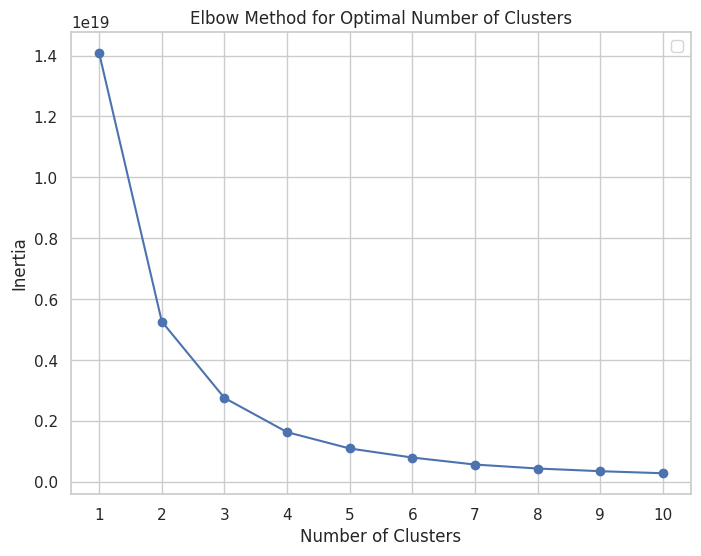

In [ ]:
#Elbow Method
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Menyimpan nilai inertia
inertia = []

# Mencoba nilai n_clusters dari 1 hingga 10
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(df_rfm)
    inertia.append(kmeans.inertia_)

# Plot Elbow Method
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), inertia, marker='o', linestyle='-', color='b')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xticks(range(1, 11))
plt.grid(True)



plt.legend()
plt.show()


In [ ]:
import numpy as np
import plotly.graph_objs as go
import plotly.offline as py

# Kode KMeans dari kode pertama
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(df_rfm[['days_since_last_purchase', 'total_transaction', 'total_amount']])
df_rfm['cluster'] = kmeans.labels_

# Warna yang akan digunakan untuk mewarnai klaster
colors = ['red', 'blue']

# Kode Plotly 3D dari kode kedua
trace1 = go.Scatter3d(
    x=df_rfm['days_since_last_purchase'],
    y=df_rfm['total_transaction'],
    z=df_rfm['total_amount'],
    mode='markers',
    marker=dict(
        color=[colors[cluster] for cluster in df_rfm['cluster']],
        size=20,
        line=dict(
            color=[colors[cluster] for cluster in df_rfm['cluster']],
            width=12
        ),
        opacity=0.8
    )
)

data = [trace1]

layout = go.Layout(
    title='Clusters',
    scene=dict(
        xaxis=dict(title='days_since_last_purchase'),
        yaxis=dict(title='total_transaction'),
        zaxis=dict(title='total_amount')
    )
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

<ipython-input-98-12b974ae91b5>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df_rfm

,days_since_last_purchase,total_transaction,total_amount,cluster
0,2,89,48693665,1
1,471,1,115702,0
2,100,2,400724,0
3,347,3,2332833,0
4,327,3,521337,0
...,...,...,...,...
50700,304,6,3499814,0
50701,4,37,16208689,0
50702,32,44,31323201,1
50703,2,96,57467588,1


**Silhouette score k-means**

In [ ]:
#shiluete score
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_score

# Inisialisasi MinMaxScaler
scaler = MinMaxScaler()

# Skalakan data dengan MinMaxScaler
df_rfm_scaled = scaler.fit_transform(df_rfm)

# Pilih jumlah klaster yang ingin dievaluasi
n_clusters_list = [2, 3, 4, 5]  # Misalnya, evaluasi 3, 4, dan 5 klaster

for n_clusters in n_clusters_list:
    # Inisialisasi dan latih model KMeans pada data yang telah diskalakan
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(df_rfm_scaled)

    # Prediksi klaster untuk setiap sampel
    cluster_labels = kmeans.labels_

    # Hitung Silhouette Score
    silhouette_avg = silhouette_score(df_rfm_scaled, cluster_labels)
    print(f"For n_clusters={n_clusters}, Silhouette Score is {silhouette_avg}")


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



For n_clusters=2, Silhouette Score is 0.8259139982588731


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



For n_clusters=3, Silhouette Score is 0.7620591548565345


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



For n_clusters=4, Silhouette Score is 0.6902686636072111


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



For n_clusters=5, Silhouette Score is 0.6108071502094279


**Hyperparameter Tuning K-Means**

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_score

# Inisialisasi MinMaxScaler
scaler = MinMaxScaler()
df_rfm_scaled = scaler.fit_transform(df_rfm)  # Skalakan df_rfm dengan MinMaxScaler

# Inisialisasi model KMeans
kmeans = KMeans()

# Hyperparameters yang akan diuji
param_grid = {
    'n_clusters': [2, 3, 4, 5],  # Variasi jumlah klaster
    'init': ['k-means++', 'random'],  # Metode inisialisasi
    'max_iter': [100, 500, 1000]  # Variasi jumlah iterasi maksimum
}

# Buat fungsi Silhouette Score sebagai metrik evaluasi
def silhouette_scorer(estimator, X):
    labels = estimator.fit_predict(X)
    return silhouette_score(X, labels)

# GridSearch untuk mencari kombinasi hyperparameter terbaik
grid_search = GridSearchCV(estimator=kmeans, param_grid=param_grid, cv=4, scoring=silhouette_scorer)
grid_search.fit(df_rfm_scaled)  # Gunakan df_rfm yang telah diskalakan dengan MinMaxScaler

# Menampilkan hasil hyperparameter tuning
print("Hyperparameter terbaik:", grid_search.best_params_)
print("Skor terbaik (Silhouette Score):", grid_search.best_score_)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

Hyperparameter terbaik: {'init': 'k-means++', 'max_iter': 100, 'n_clusters': 2}
Skor terbaik (Silhouette Score): 0.8259122415089591


In [ ]:
df_rfm['cluster'].value_counts()

0    46821
1     3884
Name: cluster, dtype: int64

####Evaluasi K-Means Jumlah Cluster

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler

# Inisialisasi MinMaxScaler
scaler = MinMaxScaler()
df_rfm_scaled = scaler.fit_transform(df_rfm)  # Skalakan df_rfm dengan MinMaxScaler

# Evaluasi SSE
sse = []
index = range(1, 10)
for i in index:
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(df_rfm_scaled)
    sse_ = kmeans.inertia_
    sse.append(sse_)
    print(i, sse_)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



1 5828.050074566348


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



2 2002.0904026819344


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



3 593.8679562440825


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



4 313.12954336868864


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



5 216.18918976137869


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



6 174.61255069041005


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



7 133.50437295163442


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



8 108.93909164989972


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



9 86.44096615968641


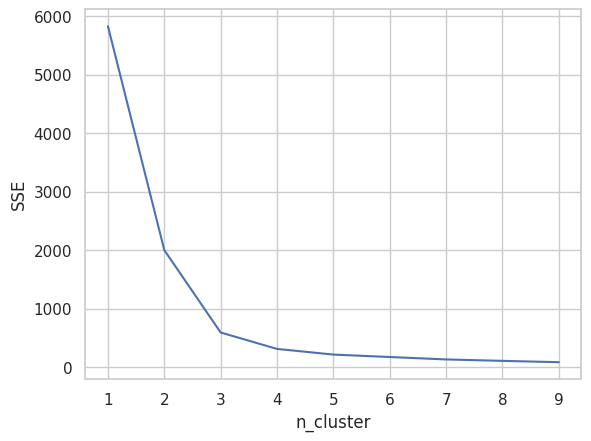

In [ ]:
plt.plot(index, sse)
plt.xlabel('n_cluster')
plt.ylabel('SSE')
plt.show()

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn import metrics
import pandas as pd

# Inisialisasi MinMaxScaler
scaler = MinMaxScaler()
df_rfm_scaled = scaler.fit_transform(df_rfm)  # Skalakan df_rfm dengan MinMaxScaler

rand = []
index = range(1, 10)
for i in index:
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(df_rfm_scaled)
    rand_ = metrics.adjusted_rand_score(df_rfm['cluster'], kmeans.labels_)
    rand.append(rand_)
    print(i, rand_)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



1 0.0


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



2 1.0


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



3 0.47513694180143173


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



4 0.30804785350559416


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



5 0.1973502215803364


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



6 0.1454185468245043


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



7 0.14266874571889213


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



8 0.09937778728692019


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



9 0.09196571671202564


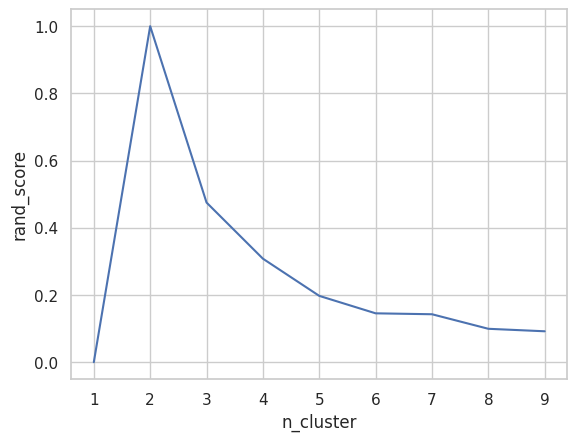

In [ ]:
plt.plot(index, rand)
plt.xlabel('n_cluster')
plt.ylabel('rand_score')
plt.show()

In [ ]:
#bouldin score
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances_argmin_min, pairwise_distances
import numpy as np

# Skalakan fitur menggunakan MinMaxScaler
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df_rfm)

bouldin_scores = []

for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=0).fit(scaled_data)
    cluster_labels = kmeans.labels_
    cluster_centers = kmeans.cluster_centers_

    # Menghitung jarak intra-cluster minimum
    min_distances = pairwise_distances_argmin_min(scaled_data, cluster_centers)

    # Menghitung skor Bouldin
    cluster_bouldin_scores = []

    for i in range(k):
        intra_cluster_distance = min_distances[1][i]
        other_clusters_distances = []

        for j in range(k):
            if j != i:
                other_cluster_distance = np.mean(pairwise_distances(cluster_centers[i].reshape(1, -1),
                                                                    cluster_centers[j].reshape(1, -1)))
                other_clusters_distances.append(other_cluster_distance)

        max_mean = max(other_clusters_distances) if other_clusters_distances else 0
        bouldin_score = (intra_cluster_distance + max_mean) / max(1e-6, max_mean)
        cluster_bouldin_scores.append(bouldin_score)

    bouldin_scores.append(np.mean(cluster_bouldin_scores))

# Menampilkan skor Bouldin untuk setiap jumlah cluster yang dicoba
for k, score in enumerate(bouldin_scores, start=2):
    print(f'Jumlah Cluster={k}, Skor Bouldin={score}')


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

Jumlah Cluster=2, Skor Bouldin=1.0471206138104296
Jumlah Cluster=3, Skor Bouldin=1.0598730321900927
Jumlah Cluster=4, Skor Bouldin=1.0545610626432782
Jumlah Cluster=5, Skor Bouldin=1.0258394437609806
Jumlah Cluster=6, Skor Bouldin=1.0321075622245133
Jumlah Cluster=7, Skor Bouldin=1.0307734508150272
Jumlah Cluster=8, Skor Bouldin=1.020421424364574
Jumlah Cluster=9, Skor Bouldin=1.021060748067267
Jumlah Cluster=10, Skor Bouldin=1.0227093776827352


####Hyperparameter Tuning DBSCAN

In [ ]:
import itertools
import numpy as np

epsilon = np.linspace(0.01, 1, num=10)
min_samples = np.arange(2, 10, step=1)
combinations = list(itertools.product(epsilon, min_samples))
N = len(combinations)

print(epsilon)
print(min_samples)
print(N)

[0.01 0.12 0.23 0.34 0.45 0.56 0.67 0.78 0.89 1.  ]
[2 3 4 5 6 7 8 9]
80


In [ ]:
from itertools import product

param_grid = []

for eps, min_sample in product(epsilon, min_samples):
    param_grid.append({'epsilon': eps, 'min_samples': min_sample})

param_grid

[{'epsilon': 0.01, 'min_samples': 2},
 {'epsilon': 0.01, 'min_samples': 3},
 {'epsilon': 0.01, 'min_samples': 4},
 {'epsilon': 0.01, 'min_samples': 5},
 {'epsilon': 0.01, 'min_samples': 6},
 {'epsilon': 0.01, 'min_samples': 7},
 {'epsilon': 0.01, 'min_samples': 8},
 {'epsilon': 0.01, 'min_samples': 9},
 {'epsilon': 0.12, 'min_samples': 2},
 {'epsilon': 0.12, 'min_samples': 3},
 {'epsilon': 0.12, 'min_samples': 4},
 {'epsilon': 0.12, 'min_samples': 5},
 {'epsilon': 0.12, 'min_samples': 6},
 {'epsilon': 0.12, 'min_samples': 7},
 {'epsilon': 0.12, 'min_samples': 8},
 {'epsilon': 0.12, 'min_samples': 9},
 {'epsilon': 0.23, 'min_samples': 2},
 {'epsilon': 0.23, 'min_samples': 3},
 {'epsilon': 0.23, 'min_samples': 4},
 {'epsilon': 0.23, 'min_samples': 5},
 {'epsilon': 0.23, 'min_samples': 6},
 {'epsilon': 0.23, 'min_samples': 7},
 {'epsilon': 0.23, 'min_samples': 8},
 {'epsilon': 0.23, 'min_samples': 9},
 {'epsilon': 0.34, 'min_samples': 2},
 {'epsilon': 0.34, 'min_samples': 3},
 {'epsilon':

In [ ]:
def grid_search(combinations, X):
    scores = []  # Scores for all label
    all_labels = []  # All labels for each iteration

    for i, (eps, num_samples) in enumerate(combinations):
        dbscan_model = DBSCAN(eps=eps, min_samples=num_samples).fit(X)
        labels = dbscan_model.labels_
        labels_set = set(labels)
        num_clusters = len(labels_set)

        if -1 in labels_set:
            num_clusters -= 1

        if num_clusters < 2 or num_clusters > 25:
            scores.append(-20)
            all_labels.append("poor")
        else:
            scores.append(silhouette_score(X, labels))
            all_labels.append(labels)

        print(f"At iteration: {i+1}, eps: {eps}, min_samples: {num_samples}, number of clusters: {num_clusters}")

    best_index = np.argmax(scores)
    best_parameters = combinations[best_index]
    best_labels = all_labels[best_index]
    best_score = scores[best_index]

    return {
        'best_epsilon': best_parameters[0],
        'best_min_samples': best_parameters[1],
        'best_labels': best_labels,
        'best_score': best_score
    }


In [ ]:
bestpara = grid_search(combinations, x)

At iteration: 1, eps: 0.01, min_samples: 2, number of clusters: 54
At iteration: 2, eps: 0.01, min_samples: 3, number of clusters: 22
At iteration: 3, eps: 0.01, min_samples: 4, number of clusters: 16
At iteration: 4, eps: 0.01, min_samples: 5, number of clusters: 8
At iteration: 5, eps: 0.01, min_samples: 6, number of clusters: 8
At iteration: 6, eps: 0.01, min_samples: 7, number of clusters: 4
At iteration: 7, eps: 0.01, min_samples: 8, number of clusters: 6
At iteration: 8, eps: 0.01, min_samples: 9, number of clusters: 3
At iteration: 9, eps: 0.12, min_samples: 2, number of clusters: 2
At iteration: 10, eps: 0.12, min_samples: 3, number of clusters: 1
At iteration: 11, eps: 0.12, min_samples: 4, number of clusters: 1
At iteration: 12, eps: 0.12, min_samples: 5, number of clusters: 1
At iteration: 13, eps: 0.12, min_samples: 6, number of clusters: 1
At iteration: 14, eps: 0.12, min_samples: 7, number of clusters: 1
At iteration: 15, eps: 0.12, min_samples: 8, number of clusters: 1
A

In [ ]:
print(bestpara)

{'best_epsilon': 0.12, 'best_min_samples': 2, 'best_labels': array([0, 0, 0, ..., 0, 0, 0]), 'best_score': 0.8447298419817189}


In [ ]:
labels_dbscan = bestpara['best_labels']

In [ ]:
df_merge_rfmc['Cluster DBSCAN'] = labels_dbscan
df_merge_rfmc

,customer_id,first_name,last_name,username,email,device_type,device_id,device_version,home_location_lat,home_location_long,...,age,gender_F,gender_M,days_since_last_purchase,total_transaction,total_products_purchased,total_amount,average_transaction_value,age_group,Cluster DBSCAN
0,7279,Bakiman,Simanjuntak,3250e5a3-1d23-4675-a647-3281879d42be,3250e5a3_1d23_4675_a647_3281879d42be@startupca...,iOS,d13dde0a-6ae1-43c3-83a7-11bbb922730b,iPad; CPU iPad OS 4_2_1 like Mac OS X,-8.631607,116.428436,...,34,0,1,2,89,204,48693665,547119.831461,Dewasa,0
1,82542,Irnanto,Wijaya,36ab08e1-03de-42a8-9e3b-59528c798824,36ab08e1_03de_42a8_9e3b_59528c798824@startupca...,iOS,e46e4c36-4630-4736-8fcf-663db29ca3b0,iPhone; CPU iPhone OS 10_3_3 like Mac OS X,-2.980807,114.924675,...,23,0,1,471,1,1,115702,115702.000000,Remaja,0
2,96453,Talia,Hastuti,44e67d0f-4743-479c-a74b-fc853ea5b355,44e67d0f_4743_479c_a74b_fc853ea5b355@startupca...,Android,eba4a196-7133-4da6-a2b4-d153541edc5b,Android 4.2,-3.908257,102.486909,...,18,1,0,100,2,2,400724,200362.000000,Remaja,0
3,8031,Ana,Laksmiwati,c5969dbf-c32b-428c-b8f4-a430def3befd,c5969dbf_c32b_428c_b8f4_a430def3befd@zakyfound...,iOS,17545c14-a543-43ab-8e30-f9195f0336f0,iPad; CPU iPad OS 10_3_3 like Mac OS X,-6.974594,107.634488,...,28,1,0,347,3,8,2332833,777611.000000,Dewasa,0
4,9152,Olivia,Hariyah,9f6bf5e5-c8dc-4684-a258-4ebf4416c519,9f6bf5e5_c8dc_4684_a258_4ebf4416c519@startupca...,iOS,33aaf2ae-54c2-45ef-a499-743413c32952,iPad; CPU iPad OS 4_2_1 like Mac OS X,-7.885658,110.042265,...,27,1,0,327,3,3,521337,173779.000000,Dewasa,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50700,38690,Dewi,Puspasari,7b8a0263-c051-4cb8-871f-5e3f2188e8c1,7b8a0263_c051_4cb8_871f_5e3f2188e8c1@startupca...,Android,fc250f5c-2a53-4573-8544-52e9bb531454,Android 4.4,-0.255086,102.794359,...,41,1,0,304,6,12,3499814,583302.333333,Dewasa,0
50701,34743,Manah,Mustofa,bf989ab1-d7eb-4ad5-b4bc-29e3cf69b35c,bf989ab1_d7eb_4ad5_b4bc_29e3cf69b35c@startupca...,Android,fa1914a5-0c12-4393-8d6c-af4e4a4de6aa,Android 4.3.1,-5.203523,105.635530,...,23,0,1,4,37,60,16208689,438072.675676,Remaja,0
50702,72065,Danu,Pradana,4af2b3d5-c573-4032-b29c-24782745a2f6,4af2b3d5_c573_4032_b29c_24782745a2f6@startupca...,Android,d8234d67-6954-4e05-8293-d37ef25bfd7e,Android 8.0.0,4.474702,95.904876,...,25,0,1,32,44,130,31323201,711890.931818,Remaja,0
50703,32818,Talia,Aryani,af0edbfa-f354-4765-813b-b9f151022555,af0edbfa_f354_4765_813b_b9f151022555@startupca...,Android,3c586f64-aab7-4dd6-be94-5d47c6361081,Android 11,-3.330376,127.028348,...,30,1,0,2,96,232,57467588,598620.708333,Dewasa,0


In [ ]:
df_merge_rfmc['Cluster DBSCAN'].value_counts()

0    50703
1        2
Name: Cluster DBSCAN, dtype: int64

In [ ]:
import numpy as np

unique_values = len(np.unique(labels_dbscan))
print(unique_values)

2


In [ ]:
df_merge_rfmc['Cluster DBSCAN'].unique()

array([0, 1])

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as py
import plotly.graph_objs as go


df_merge_rfmc['Cluster DBSCAN'] = labels_dbscan
trace1 = go.Scatter3d(
    x= df_merge_rfmc['total_amount'],
    y= df_merge_rfmc['days_since_last_purchase'],
    z= df_merge_rfmc['total_transaction'],
    mode='markers',
     marker=dict(
        color = df_merge_rfmc['Cluster DBSCAN'],
        size= 20,
        line=dict(
            color= df_merge_rfmc['Cluster DBSCAN'],
            width= 12
        ),
        opacity=0.8
     )
)
data = [trace1]
layout = go.Layout(
#     margin=dict(
#         l=0,
#         r=0,
#         b=0,
#         t=0
#     )
    title= 'Clusters',
    scene = dict(
            xaxis = dict(title  = 'Total Amount'),
            yaxis = dict(title  = 'Days Since Last Purchase'),
            zaxis = dict(title  = 'Total Transaction')
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from tabulate import tabulate

# Assuming 'created_at_date' is the datetime column
# You may want to convert it to a numerical representation, e.g., Unix timestamp

# Compute number of customers
num_observations = len(df_merge_rfmc)

# Separate the features and the cluster labels
clusters = df_merge_rfmc['Cluster DBSCAN']

# Compute the metrics
sil_score = silhouette_score(x, clusters)
calinski_score = calinski_harabasz_score(x, clusters)
davies_score = davies_bouldin_score(x, clusters)

# Create a table to display the metrics and the number of observations
table_data = [
    ["Number of Observations", num_observations],
    ["Silhouette Score", sil_score],
    ["Calinski Harabasz Score", calinski_score],
    ["Davies Bouldin Score", davies_score]
]

# Print the table
print(tabulate(table_data, headers=["Metric", "Value"], tablefmt='pretty'))


+-------------------------+---------------------+
|         Metric          |        Value        |
+-------------------------+---------------------+
| Number of Observations  |        50705        |
|    Silhouette Score     | 0.8447298419817189  |
| Calinski Harabasz Score |  79.61308891344542  |
|  Davies Bouldin Score   | 0.15695344239465353 |
+-------------------------+---------------------+


####Hyperparameter Tuning for Agglomerative Clustering

In [ ]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from itertools import product
import pandas as pd

# Assuming X is your feature matrix

def agglomerative_grid_search(param_grid, X):
    results = []  # Placeholder for results

    # Loop over parameter combinations
    for params in product(*param_grid.values()):
        param_dict = dict(zip(param_grid.keys(), params))

        # Skip combinations not compatible with 'ward'
        if param_dict['linkage'] == 'ward':
            affinity_options = ['euclidean']
        else:
            affinity_options = ['euclidean', 'manhattan', 'cosine']

        for affinity in affinity_options:
            # Create AgglomerativeClustering instance
            agg_clustering = AgglomerativeClustering(n_clusters=param_dict['n_clusters'],
                                                     affinity=affinity,
                                                     linkage=param_dict['linkage'])

            # Fit and predict clusters
            labels = agg_clustering.fit_predict(X)

            # Compute silhouette score
            sil_score = silhouette_score(X, labels)

            # Store results
            results.append({
                'n_clusters': param_dict['n_clusters'],
                'affinity': affinity,
                'linkage': param_dict['linkage'],
                'silhouette_score': sil_score,
                'labels' : labels
            })

    # Convert results to DataFrame
    results_df = pd.DataFrame(results)

    # Get the best parameters and best silhouette score
    best_params = results_df.loc[results_df['silhouette_score'].idxmax()]

    return best_params
    return results_df

In [ ]:
param_grid = {
    'n_clusters': [2, 3, 4, 5],
    'linkage': ['ward', 'complete', 'average', 'single']
}
best_params = agglomerative_grid_search(param_grid, x)

# Print the results
print("Best Parameters:")
print(best_params)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning:

Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning:

Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning:

Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning:

Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning:

Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead

/usr/local/lib/pytho

Best Parameters:
n_clusters                                                          2
affinity                                                    manhattan
linkage                                                        single
silhouette_score                                             0.850705
labels              [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
Name: 8, dtype: object


In [ ]:
labels_agglomerative = best_params['labels']

In [ ]:
df_merge_rfmc['Cluster Agglomerative'] = labels_agglomerative
df_merge_rfmc

,customer_id,first_name,last_name,username,email,device_type,device_id,device_version,home_location_lat,home_location_long,...,gender_F,gender_M,days_since_last_purchase,total_transaction,total_products_purchased,total_amount,average_transaction_value,age_group,Cluster DBSCAN,Cluster Agglomerative
0,7279,Bakiman,Simanjuntak,3250e5a3-1d23-4675-a647-3281879d42be,3250e5a3_1d23_4675_a647_3281879d42be@startupca...,iOS,d13dde0a-6ae1-43c3-83a7-11bbb922730b,iPad; CPU iPad OS 4_2_1 like Mac OS X,-8.631607,116.428436,...,0,1,2,89,204,48693665,547119.831461,Dewasa,0,0
1,82542,Irnanto,Wijaya,36ab08e1-03de-42a8-9e3b-59528c798824,36ab08e1_03de_42a8_9e3b_59528c798824@startupca...,iOS,e46e4c36-4630-4736-8fcf-663db29ca3b0,iPhone; CPU iPhone OS 10_3_3 like Mac OS X,-2.980807,114.924675,...,0,1,471,1,1,115702,115702.000000,Remaja,0,0
2,96453,Talia,Hastuti,44e67d0f-4743-479c-a74b-fc853ea5b355,44e67d0f_4743_479c_a74b_fc853ea5b355@startupca...,Android,eba4a196-7133-4da6-a2b4-d153541edc5b,Android 4.2,-3.908257,102.486909,...,1,0,100,2,2,400724,200362.000000,Remaja,0,0
3,8031,Ana,Laksmiwati,c5969dbf-c32b-428c-b8f4-a430def3befd,c5969dbf_c32b_428c_b8f4_a430def3befd@zakyfound...,iOS,17545c14-a543-43ab-8e30-f9195f0336f0,iPad; CPU iPad OS 10_3_3 like Mac OS X,-6.974594,107.634488,...,1,0,347,3,8,2332833,777611.000000,Dewasa,0,0
4,9152,Olivia,Hariyah,9f6bf5e5-c8dc-4684-a258-4ebf4416c519,9f6bf5e5_c8dc_4684_a258_4ebf4416c519@startupca...,iOS,33aaf2ae-54c2-45ef-a499-743413c32952,iPad; CPU iPad OS 4_2_1 like Mac OS X,-7.885658,110.042265,...,1,0,327,3,3,521337,173779.000000,Dewasa,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50700,38690,Dewi,Puspasari,7b8a0263-c051-4cb8-871f-5e3f2188e8c1,7b8a0263_c051_4cb8_871f_5e3f2188e8c1@startupca...,Android,fc250f5c-2a53-4573-8544-52e9bb531454,Android 4.4,-0.255086,102.794359,...,1,0,304,6,12,3499814,583302.333333,Dewasa,0,0
50701,34743,Manah,Mustofa,bf989ab1-d7eb-4ad5-b4bc-29e3cf69b35c,bf989ab1_d7eb_4ad5_b4bc_29e3cf69b35c@startupca...,Android,fa1914a5-0c12-4393-8d6c-af4e4a4de6aa,Android 4.3.1,-5.203523,105.635530,...,0,1,4,37,60,16208689,438072.675676,Remaja,0,0
50702,72065,Danu,Pradana,4af2b3d5-c573-4032-b29c-24782745a2f6,4af2b3d5_c573_4032_b29c_24782745a2f6@startupca...,Android,d8234d67-6954-4e05-8293-d37ef25bfd7e,Android 8.0.0,4.474702,95.904876,...,0,1,32,44,130,31323201,711890.931818,Remaja,0,0
50703,32818,Talia,Aryani,af0edbfa-f354-4765-813b-b9f151022555,af0edbfa_f354_4765_813b_b9f151022555@startupca...,Android,3c586f64-aab7-4dd6-be94-5d47c6361081,Android 11,-3.330376,127.028348,...,1,0,2,96,232,57467588,598620.708333,Dewasa,0,0


In [ ]:
df_merge_rfmc['Cluster Agglomerative'].value_counts()

0    50704
1        1
Name: Cluster Agglomerative, dtype: int64

In [ ]:
import numpy as np

unique_values = len(np.unique(labels_agglomerative))
print(unique_values)

2


In [ ]:
df_merge_rfmc['Cluster Agglomerative'].unique()

array([0, 1])

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as py
import plotly.graph_objs as go


df_merge_rfmc['Cluster Agglomerative'] = labels_agglomerative
trace1 = go.Scatter3d(
    x= df_merge_rfmc['total_amount'],
    y= df_merge_rfmc['days_since_last_purchase'],
    z= df_merge_rfmc['total_transaction'],
    mode='markers',
     marker=dict(
        color = df_merge_rfmc['Cluster Agglomerative'],
        size= 20,
        line=dict(
            color= df_merge_rfmc['Cluster Agglomerative'],
            width= 12
        ),
        opacity=0.8
     )
)
data = [trace1]
layout = go.Layout(
#     margin=dict(
#         l=0,
#         r=0,
#         b=0,
#         t=0
#     )
    title= 'Clusters',
    scene = dict(
            xaxis = dict(title  = 'Total Amount'),
            yaxis = dict(title  = 'Days Since Last Purchase'),
            zaxis = dict(title  = 'Total Transaction')
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from tabulate import tabulate

# Assuming 'created_at_date' is the datetime column
# You may want to convert it to a numerical representation, e.g., Unix timestamp

# Compute number of customers
num_observations = len(df_merge_rfmc)

# Separate the features and the cluster labels
clusters = df_merge_rfmc['Cluster Agglomerative']

# Compute the metrics
sil_score = silhouette_score(x, clusters)
calinski_score = calinski_harabasz_score(x, clusters)
davies_score = davies_bouldin_score(x, clusters)

# Create a table to display the metrics and the number of observations
table_data = [
    ["Number of Observations", num_observations],
    ["Silhouette Score", sil_score],
    ["Calinski Harabasz Score", calinski_score],
    ["Davies Bouldin Score", davies_score]
]

# Print the table
print(tabulate(table_data, headers=["Metric", "Value"], tablefmt='pretty'))


+-------------------------+---------------------+
|         Metric          |        Value        |
+-------------------------+---------------------+
| Number of Observations  |        50705        |
|    Silhouette Score     | 0.8507052458437538  |
| Calinski Harabasz Score |  43.11505135979468  |
|  Davies Bouldin Score   | 0.11095351356121538 |
+-------------------------+---------------------+


####Hyperparemeter Tuning for K-Medoids

In [ ]:
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import silhouette_score
from itertools import product
import pandas as pd

def kmedoids_grid_search(param_grid, X):
    results = []  # Placeholder for results

    # Loop over parameter combinations
    for params in product(*param_grid.values()):
        param_dict = dict(zip(param_grid.keys(), params))

        # Create KMedoids instance
        kmedoids_model = KMedoids(n_clusters=param_dict['n_clusters'],
                                  metric=param_dict['metric'],
                                  max_iter=param_dict['max_iter'])

        # Fit and predict clusters
        labels = kmedoids_model.fit_predict(X)

        # Compute silhouette score
        sil_score = silhouette_score(X, labels)

        # Store results
        results.append({
            'n_clusters': param_dict['n_clusters'],
            'metric': param_dict['metric'],
            'max_iter': param_dict['max_iter'],
            'silhouette_score': sil_score,
            'labels' : labels
        })

    # Convert results to DataFrame
    results_df = pd.DataFrame(results)

    # Get the best parameters and best silhouette score
    best_params = results_df.loc[results_df['silhouette_score'].idxmax()]

    return best_params, results_df

In [ ]:
# Contoh penggunaan
param_grid = {
    'n_clusters': [2, 3, 4, 5],
    'metric': ['euclidean', 'manhattan'],
    'max_iter': [50, 100, 200],
}

best_params, results_df = kmedoids_grid_search(param_grid, x)
print("Best Parameters:")
print(best_params)

/usr/local/lib/python3.10/dist-packages/sklearn_extra/cluster/_k_medoids.py:297: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.



Best Parameters:
n_clusters                                                          2
metric                                                      euclidean
max_iter                                                           50
silhouette_score                                             0.696507
labels              [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, ...
Name: 0, dtype: object


In [ ]:
labels_kmedoids = best_params['labels']

In [ ]:
# Add the labels to df_merge_rfmc
df_merge_rfmc['Cluster K-Medoids'] = labels_kmedoids
df_merge_rfmc

,customer_id,first_name,last_name,username,email,device_type,device_id,device_version,home_location_lat,home_location_long,...,gender_M,days_since_last_purchase,total_transaction,total_products_purchased,total_amount,average_transaction_value,age_group,Cluster DBSCAN,Cluster Agglomerative,Cluster K-Medoids
0,7279,Bakiman,Simanjuntak,3250e5a3-1d23-4675-a647-3281879d42be,3250e5a3_1d23_4675_a647_3281879d42be@startupca...,iOS,d13dde0a-6ae1-43c3-83a7-11bbb922730b,iPad; CPU iPad OS 4_2_1 like Mac OS X,-8.631607,116.428436,...,1,2,89,204,48693665,547119.831461,Dewasa,0,0,1
1,82542,Irnanto,Wijaya,36ab08e1-03de-42a8-9e3b-59528c798824,36ab08e1_03de_42a8_9e3b_59528c798824@startupca...,iOS,e46e4c36-4630-4736-8fcf-663db29ca3b0,iPhone; CPU iPhone OS 10_3_3 like Mac OS X,-2.980807,114.924675,...,1,471,1,1,115702,115702.000000,Remaja,0,0,1
2,96453,Talia,Hastuti,44e67d0f-4743-479c-a74b-fc853ea5b355,44e67d0f_4743_479c_a74b_fc853ea5b355@startupca...,Android,eba4a196-7133-4da6-a2b4-d153541edc5b,Android 4.2,-3.908257,102.486909,...,0,100,2,2,400724,200362.000000,Remaja,0,0,1
3,8031,Ana,Laksmiwati,c5969dbf-c32b-428c-b8f4-a430def3befd,c5969dbf_c32b_428c_b8f4_a430def3befd@zakyfound...,iOS,17545c14-a543-43ab-8e30-f9195f0336f0,iPad; CPU iPad OS 10_3_3 like Mac OS X,-6.974594,107.634488,...,0,347,3,8,2332833,777611.000000,Dewasa,0,0,1
4,9152,Olivia,Hariyah,9f6bf5e5-c8dc-4684-a258-4ebf4416c519,9f6bf5e5_c8dc_4684_a258_4ebf4416c519@startupca...,iOS,33aaf2ae-54c2-45ef-a499-743413c32952,iPad; CPU iPad OS 4_2_1 like Mac OS X,-7.885658,110.042265,...,0,327,3,3,521337,173779.000000,Dewasa,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50700,38690,Dewi,Puspasari,7b8a0263-c051-4cb8-871f-5e3f2188e8c1,7b8a0263_c051_4cb8_871f_5e3f2188e8c1@startupca...,Android,fc250f5c-2a53-4573-8544-52e9bb531454,Android 4.4,-0.255086,102.794359,...,0,304,6,12,3499814,583302.333333,Dewasa,0,0,1
50701,34743,Manah,Mustofa,bf989ab1-d7eb-4ad5-b4bc-29e3cf69b35c,bf989ab1_d7eb_4ad5_b4bc_29e3cf69b35c@startupca...,Android,fa1914a5-0c12-4393-8d6c-af4e4a4de6aa,Android 4.3.1,-5.203523,105.635530,...,1,4,37,60,16208689,438072.675676,Remaja,0,0,1
50702,72065,Danu,Pradana,4af2b3d5-c573-4032-b29c-24782745a2f6,4af2b3d5_c573_4032_b29c_24782745a2f6@startupca...,Android,d8234d67-6954-4e05-8293-d37ef25bfd7e,Android 8.0.0,4.474702,95.904876,...,1,32,44,130,31323201,711890.931818,Remaja,0,0,1
50703,32818,Talia,Aryani,af0edbfa-f354-4765-813b-b9f151022555,af0edbfa_f354_4765_813b_b9f151022555@startupca...,Android,3c586f64-aab7-4dd6-be94-5d47c6361081,Android 11,-3.330376,127.028348,...,0,2,96,232,57467588,598620.708333,Dewasa,0,0,1


In [ ]:
df_merge_rfmc['Cluster K-Medoids'].value_counts()

1    41862
0     8843
Name: Cluster K-Medoids, dtype: int64

In [ ]:
import numpy as np

unique_values = len(np.unique(labels_kmedoids))
print(unique_values)

2


In [ ]:
df_merge_rfmc['Cluster K-Medoids'].unique()

array([1, 0])

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as py
import plotly.graph_objs as go


df_merge_rfmc['Cluster K-Medoids'] = labels_kmedoids
trace1 = go.Scatter3d(
    x= df_merge_rfmc['total_amount'],
    y= df_merge_rfmc['days_since_last_purchase'],
    z= df_merge_rfmc['total_transaction'],
    mode='markers',
     marker=dict(
        color = df_merge_rfmc['Cluster K-Medoids'],
        size= 20,
        line=dict(
            color= df_merge_rfmc['Cluster K-Medoids'],
            width= 12
        ),
        opacity=0.8
     )
)
data = [trace1]
layout = go.Layout(
#     margin=dict(
#         l=0,
#         r=0,
#         b=0,
#         t=0
#     )
    title= 'Clusters',
    scene = dict(
            xaxis = dict(title  = 'Total Amount'),
            yaxis = dict(title  = 'Days Since Last Purchase'),
            zaxis = dict(title  = 'Total Transaction')
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from tabulate import tabulate

# Assuming 'created_at_date' is the datetime column
# You may want to convert it to a numerical representation, e.g., Unix timestamp

# Compute number of customers
num_observations = len(df_merge_rfmc)

# Separate the features and the cluster labels
clusters = df_merge_rfmc['Cluster K-Medoids']

# Compute the metrics
sil_score = silhouette_score(x, clusters)
calinski_score = calinski_harabasz_score(x, clusters)
davies_score = davies_bouldin_score(x, clusters)

# Create a table to display the metrics and the number of observations
table_data = [
    ["Number of Observations", num_observations],
    ["Silhouette Score", sil_score],
    ["Calinski Harabasz Score", calinski_score],
    ["Davies Bouldin Score", davies_score]
]

# Print the table
print(tabulate(table_data, headers=["Metric", "Value"], tablefmt='pretty'))


+-------------------------+-------------------+
|         Metric          |       Value       |
+-------------------------+-------------------+
| Number of Observations  |       50705       |
|    Silhouette Score     | 0.696506801837419 |
| Calinski Harabasz Score | 89795.16420536951 |
|  Davies Bouldin Score   | 0.570522741331495 |
+-------------------------+-------------------+
